# Step 1: Data Preparation and Loading

This cell handles the setup and loading of the **horse2zebra** dataset for the CycleGAN model. It performs the following key tasks:

1.  **Data Extraction:** Checks for the dataset zip file and extracts it into the current directory.
2.  **Preprocessing:** Defines the image transformations.
    * **Resizing:** Images are resized to $128 \times 128$ as suggested in the project requirements.
    * **Normalization:** Images are normalized with mean 0.5 and standard deviation 0.5 to scale pixel values to the range $[-1, 1]$, which is suitable for the Tanh activation function in the generator.
3.  **Custom Dataset (Unpaired):** Implements the `HorseZebraDataset` class.
    * Crucially, this dataset handles **unpaired** training data. In the `__getitem__` method, for a given image from Domain A (Horse), a **random** image is selected from Domain B (Zebra). This reflects the unsupervised nature of CycleGAN, where no ground-truth pairings exist.
4.  **Visualization:** Creates a PyTorch `DataLoader` with `batch_size=1` and visualizes a sample pair from the training set to verify correct loading and preprocessing.

Found 'horse2zebra.zip'.
Directory horse2zebra already exists. Skipping extraction.
Loaded dataset with 1067 horses (A) and 1334 zebras (B).


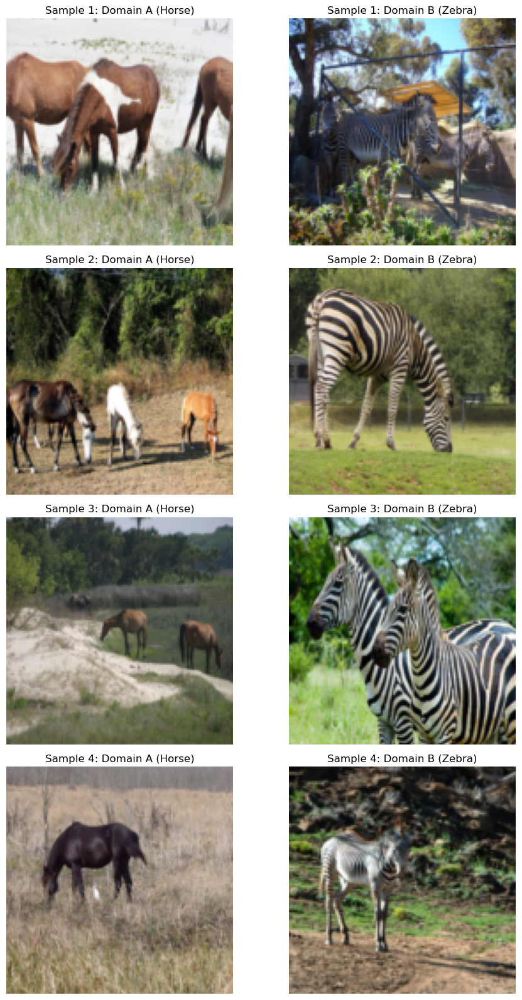

In [ ]:
import os
import zipfile
import random
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

# Dataset Configuration
DATA_ZIP = "horse2zebra.zip"
DATA_DIR = "horse2zebra"
IMG_SIZE = 128 
BATCH_SIZE = 1 

if not os.path.exists(DATA_ZIP):
    print(f"Error: '{DATA_ZIP}' not found.")
else:
    print(f"Found '{DATA_ZIP}'.")
    
    if not os.path.exists(DATA_DIR):
        try:
            with zipfile.ZipFile(DATA_ZIP, 'r') as zip_ref:
                zip_ref.extractall(".")
        except Exception as e:
            raise
    else:
        print(f"Directory {DATA_DIR} already exists. Skipping extraction.")

    data_transform = transforms.Compose([
        transforms.Resize((IMG_SIZE, IMG_SIZE)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
    ])

    class HorseZebraDataset(Dataset):
        def __init__(self, root_dir, transform=None, mode='train'):
            self.transform = transform
            self.path_A = os.path.join(root_dir, f'{mode}A')
            self.path_B = os.path.join(root_dir, f'{mode}B')
            
            self.files_A = sorted(os.listdir(self.path_A))
            self.files_B = sorted(os.listdir(self.path_B))
            
            self.len_A = len(self.files_A)
            self.len_B = len(self.files_B)

        def __getitem__(self, index):
            img_path_A = os.path.join(self.path_A, self.files_A[index % self.len_A])
            img_A = Image.open(img_path_A).convert("RGB")
            
            random_index_B = random.randint(0, self.len_B - 1)
            img_path_B = os.path.join(self.path_B, self.files_B[random_index_B])
            img_B = Image.open(img_path_B).convert("RGB")

            if self.transform:
                img_A = self.transform(img_A)
                img_B = self.transform(img_B)
                
            return {'A': img_A, 'B': img_B}

        def __len__(self):
            return max(self.len_A, self.len_B)

    # Create DataLoader
    try:
        train_dataset = HorseZebraDataset(root_dir=DATA_DIR, transform=data_transform, mode='train')
        train_loader = DataLoader(dataset=train_dataset, batch_size=BATCH_SIZE, shuffle=True)
        
        print(f"Loaded dataset with {len(train_dataset.files_A)} horses (A) and {len(train_dataset.files_B)} zebras (B).")

        # Visualize Multiple Random Samples
        def denormalize(img_tensor):
            return (img_tensor * 0.5) + 0.5

        NUM_SAMPLES_TO_SHOW = 4 
        
        data_iter = iter(train_loader)
        
        fig, axes = plt.subplots(NUM_SAMPLES_TO_SHOW, 2, figsize=(10, 4 * NUM_SAMPLES_TO_SHOW))
        
        for i in range(NUM_SAMPLES_TO_SHOW):
            try:
                batch = next(data_iter)
                img_A = batch['A'][0]
                img_B = batch['B'][0]

                # Domain A (Horse)
                img_A_pil = transforms.ToPILImage()(denormalize(img_A))
                axes[i, 0].imshow(img_A_pil)
                axes[i, 0].set_title(f"Sample {i+1}: Domain A (Horse)")
                axes[i, 0].axis('off')

                # Domain B (Zebra)
                img_B_pil = transforms.ToPILImage()(denormalize(img_B))
                axes[i, 1].imshow(img_B_pil)
                axes[i, 1].set_title(f"Sample {i+1}: Domain B (Zebra)")
                axes[i, 1].axis('off')
            
            except StopIteration:
                print("Not enough images in the dataloader to show.")
                break
        
        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"\n---!!! An error occurred during data loading !!!---")
        print(f"Error: {e}")

# Step 2a: Device Configuration and Helper Modules

This cell sets up the computational environment and defines a core building block for the Generator:

1.  **Device Setup:** Checks for NVIDIA GPU availability (`cuda`) and sets the device accordingly to ensure hardware acceleration.
2.  **ResNet Block:** Implements the Residual Block architecture, which is the fundamental component of the CycleGAN Generator.
    * **Components:** Each block consists of two $3\times3$ convolutional layers, followed by **Instance Normalization** (crucial for style transfer tasks) and ReLU activation.
    * **Reflection Padding:** Uses `ReflectionPad2d` instead of standard zero-padding to reduce artifacts at the image borders.
    * **Residual Connection:** Implements the skip connection mechanism ($x + f(x)$), which helps prevent the vanishing gradient problem and allows the model to easily learn identity mappings.

In [ ]:
import torch
import torch.nn as nn

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

class ResnetBlock(nn.Module):
    def __init__(self, dim):
        super(ResnetBlock, self).__init__()
        self.conv_block = nn.Sequential(
            nn.ReflectionPad2d(1),
            nn.Conv2d(dim, dim, kernel_size=3, padding=0, bias=True),
            nn.InstanceNorm2d(dim),
            nn.ReLU(True),
            
            nn.ReflectionPad2d(1), 
            nn.Conv2d(dim, dim, kernel_size=3, padding=0, bias=True),
            nn.InstanceNorm2d(dim)
        )

    def forward(self, x):
        return x + self.conv_block(x)


Using device: cuda
Helper 'ResnetBlock' and 'device' are defined.


# Step 2b: Generator Architecture

This cell defines the `Generator` class, which is the core component responsible for translating images from one domain to another. The architecture follows the design proposed by Johnson et al., which is an **Encoder-Decoder** network with a **Residual Bottleneck**.

The network consists of three main stages:

1.  **Encoder (Downsampling):** The input image is passed through three convolutional layers. The first preserves dimension, while the next two use a stride of 2 to progressively downsample the spatial resolution and increase the feature depth. This extracts high-level features from the image.
2.  **Transformer (ResNet Blocks):** The encoded features pass through a series of `n_blocks` (typically 6 or 9) of `ResnetBlock`s. This bottleneck phase allows the network to learn complex transformations while preserving structural information via residual connections.
3.  **Decoder (Upsampling):** The transformed features are reconstructed back to the original image size using two Transposed Convolution (`ConvTranspose2d`) layers.
4.  **Output:** A final convolution with a `Tanh` activation function is applied to map the output pixel values to the range $[-1, 1]$, matching the normalized input data.

In [ ]:
class Generator(nn.Module):
    def __init__(self, input_nc=3, output_nc=3, ngf=64, n_blocks=9):
        super(Generator, self).__init__()

        # Encoder (Downsampling)
        model = [
            # Initial convolution block
            nn.ReflectionPad2d(3),
            nn.Conv2d(input_nc, ngf, kernel_size=7, padding=0, bias=True),
            nn.InstanceNorm2d(ngf),
            nn.ReLU(True),

            # d128
            nn.Conv2d(ngf, ngf * 2, kernel_size=3, stride=2, padding=1, bias=True),
            nn.InstanceNorm2d(ngf * 2),
            nn.ReLU(True),

            # d256
            nn.Conv2d(ngf * 2, ngf * 4, kernel_size=3, stride=2, padding=1, bias=True),
            nn.InstanceNorm2d(ngf * 4),
            nn.ReLU(True)
        ]

        # Transformer (ResNet Blocks)
        for _ in range(n_blocks):
            model += [ResnetBlock(ngf * 4)]

        # Decoder (Upsampling)
        model += [
            nn.ConvTranspose2d(ngf * 4, ngf * 2, kernel_size=3, stride=2, padding=1, output_padding=1, bias=True),
            nn.InstanceNorm2d(ngf * 2),
            nn.ReLU(True),

            nn.ConvTranspose2d(ngf * 2, ngf, kernel_size=3, stride=2, padding=1, output_padding=1, bias=True),
            nn.InstanceNorm2d(ngf),
            nn.ReLU(True),
        ]

        # Output Layer
        # c7s1-3
        model += [
            nn.ReflectionPad2d(3),
            nn.Conv2d(ngf, output_nc, kernel_size=7, padding=0),
            nn.Tanh()
        ]

        self.model = nn.Sequential(*model)

    def forward(self, x):
        return self.model(x)

print("Class 'Generator' is defined.")

Class 'Generator' is defined.


# Step 2c: Discriminator Architecture and Weights Initialization

This cell defines the `Discriminator` class and a helper function for weight initialization.

1.  **Discriminator (PatchGAN):** The discriminator is designed as a **PatchGAN**. Instead of outputting a single probability for the entire image (Real vs. Fake), it outputs a matrix of values. Each value in this matrix represents the realism of a specific $N \times N$ patch of the input image. This encourages the generator to produce sharp, high-frequency details and realistic textures.
    * **Architecture:** It consists of a series of convolutional layers that progressively downsample the image (stride 2) while increasing the number of feature maps (filters).
    * **Layers:**
        * **Initial Layer:** Convolution + LeakyReLU.
        * **Hidden Layers:** Convolution + Instance Normalization + LeakyReLU.
        * **Output Layer:** A final convolution that maps the features to a 1-channel output map (the patch predictions).

2.  **Weights Initialization (`weights_init`):** GANs are sensitive to initial weights. This function initializes the weights of convolutional and linear layers from a Gaussian distribution with mean 0.0 and standard deviation 0.02, as recommended in the CycleGAN paper for training stability.

In [ ]:
class Discriminator(nn.Module):
    def __init__(self, input_nc=3, ndf=64, n_layers=3):
        super(Discriminator, self).__init__()

        model = [
            nn.Conv2d(input_nc, ndf, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2, True)
        ]

        nf_mult = 1
        nf_mult_prev = 1
        
        for n in range(1, n_layers):
            nf_mult_prev = nf_mult
            nf_mult = min(2 ** n, 8)
            model += [
                nn.Conv2d(ndf * nf_mult_prev, ndf * nf_mult, kernel_size=4, stride=2, padding=1, bias=True),
                nn.InstanceNorm2d(ndf * nf_mult),
                nn.LeakyReLU(0.2, True)
            ]

        nf_mult_prev = nf_mult
        nf_mult = min(2 ** n_layers, 8)
        model += [
            nn.Conv2d(ndf * nf_mult_prev, ndf * nf_mult, kernel_size=4, stride=1, padding=1, bias=True),
            nn.InstanceNorm2d(ndf * nf_mult),
            nn.LeakyReLU(0.2, True)
        ]

        # Output 1-channel PatchGAN
        model += [nn.Conv2d(ndf * nf_mult, 1, kernel_size=4, stride=1, padding=1)]
        
        self.model = nn.Sequential(*model)

    def forward(self, x):
        return self.model(x)

# Helper Function: Weights Initialization
def weights_init(m):
    classname = m.__class__.__name__
    if hasattr(m, 'weight') and (classname.find('Conv') != -1 or classname.find('Linear') != -1):
        nn.init.normal_(m.weight.data, 0.0, 0.02)
        if hasattr(m, 'bias') and m.bias is not None:
            nn.init.constant_(m.bias.data, 0.0)
    elif classname.find('BatchNorm2d') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0.0)

print("Class 'Discriminator' and 'weights_init' function are defined.")

Class 'Discriminator' and 'weights_init' function are defined.


# Step 2d: Model Initialization and Sanity Check

This cell instantiates the full CycleGAN architecture and performs a "sanity check" to ensure everything is correctly defined before training.

1.  **Instantiation:** We create four distinct networks required for CycleGAN:
    * `G_AB`: Generator that translates domain A (Horse) $\to$ domain B (Zebra).
    * `G_BA`: Generator that translates domain B (Zebra) $\to$ domain A (Horse).
    * `D_A`: Discriminator that distinguishes real Horse images from fake ones generated by `G_BA`.
    * `D_B`: Discriminator that distinguishes real Zebra images from fake ones generated by `G_AB`.
2.  **Weight Application:** We apply the `weights_init` function to all networks to ensure they start with the correct statistical distribution (Gaussian), which is critical for GAN convergence.
3.  **Shape Verification:** We pass dummy tensors (random noise) through the networks to verify that the forward passes work without errors and that the output shapes are correct:
    * Generators should output tensors of the same shape as the input image ($Batch \times 3 \times 128 \times 128$).
    * Discriminators should output a PatchGAN matrix (e.g., $Batch \times 1 \times 14 \times 14$).

In [ ]:
# Create generators
G_AB = Generator().to(device)
G_BA = Generator().to(device)

# Create discriminators
D_A = Discriminator().to(device)
D_B = Discriminator().to(device)

# Apply weights initialization
G_AB.apply(weights_init)
G_BA.apply(weights_init)
D_A.apply(weights_init)
D_B.apply(weights_init)

print("Models initialized and weights applied.")

if 'BATCH_SIZE' not in locals():
    BATCH_SIZE = 1
if 'IMG_SIZE' not in locals():
    IMG_SIZE = 128

dummy_horse = torch.randn(BATCH_SIZE, 3, IMG_SIZE, IMG_SIZE).to(device)
dummy_zebra = torch.randn(BATCH_SIZE, 3, IMG_SIZE, IMG_SIZE).to(device)

# Test Generator
fake_zebra = G_AB(dummy_horse)
recon_horse = G_BA(fake_zebra)
print(f"\n--- Generator Test ---")
print(f"Input Horse shape:   {dummy_horse.shape}")
print(f"Fake Zebra shape:    {fake_zebra.shape}")
print(f"Recon. Horse shape:  {recon_horse.shape}")

# Test Discriminator
pred_real_horse = D_A(dummy_horse)
pred_fake_zebra = D_B(fake_zebra)
print(f"\n--- Discriminator Test (PatchGAN) ---")
print(f"D_A(real_horse) output shape: {pred_real_horse.shape}")
print(f"D_B(fake_zebra) output shape: {pred_fake_zebra.shape}")

print("\nModel architecture implementation is complete and shapes are correct.")

Models initialized and weights applied.

--- Generator Test ---
Input Horse shape:   torch.Size([1, 3, 128, 128])
Fake Zebra shape:    torch.Size([1, 3, 128, 128])
Recon. Horse shape:  torch.Size([1, 3, 128, 128])

--- Discriminator Test (PatchGAN) ---
D_A(real_horse) output shape: torch.Size([1, 1, 14, 14])
D_B(fake_zebra) output shape: torch.Size([1, 1, 14, 14])

Model architecture implementation is complete and shapes are correct.


# Step 3: Training Configuration and Initialization

This cell sets up the entire training environment, including hyperparameters, loss functions, and optimization strategies. Key components include:

1.  **Hyperparameters:** Sets critical training parameters such as the learning rate (`0.0002`), total epochs (`20`), and the weights for cycle-consistency (`lambda=10`) and identity losses.
2.  **Model Instantiation:** Initializes the four required networks ($G_{AB}, G_{BA}, D_A, D_B$) and moves them to the GPU.
3.  **Image History Buffer:** Implements a buffer to store previously generated images. This is a crucial technique from the CycleGAN paper to stabilize training. Instead of updating the discriminator only with the latest generated images, we query this buffer to provide a history of fake images, preventing the model from oscillating.
4.  **Loss Functions:**
    * **Adversarial Loss:** Uses `MSELoss` (Least Squares GAN) for more stable training compared to standard cross-entropy.
    * **Cycle & Identity Loss:** Uses `L1Loss` to enforce pixel-level consistency.
5.  **Optimizers & Schedulers:** Configures Adam optimizers for both generators and discriminators. It also defines a **Learning Rate Scheduler** that keeps the learning rate constant for the first half of training and linearly decays it to zero over the remaining epochs.

In [ ]:
import torch.optim as optim
import itertools
import time
import datetime
import torchvision.utils as vutils
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt


# Hyperparameters 
LR = 0.0002
N_EPOCHS = 20        
DECAY_START_EPOCH = 10 
IMG_SIZE = 128
BATCH_SIZE = 1
LAMBDA_CYCLE = 10.0
LAMBDA_IDENTITY = 0.5 * LAMBDA_CYCLE
start_epoch = 1

sample_dir = "sample_images/horse2zebra"
checkpoint_dir = "checkpoints/horse2zebra"
CHECKPOINT_FILE = os.path.join(checkpoint_dir, "latest_checkpoint.pth")
os.makedirs(sample_dir, exist_ok=True)
os.makedirs(checkpoint_dir, exist_ok=True)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Models
G_AB = Generator().to(device)
G_BA = Generator().to(device)
D_A = Discriminator().to(device)
D_B = Discriminator().to(device)

# Buffers 
class ImageHistoryBuffer:
    def __init__(self, max_size=50):
        assert max_size > 0
        self.max_size = max_size
        self.buffer = []

    def query(self, images):
        if self.max_size == 0: return images
        return_images = []
        for image in images:
            image = torch.unsqueeze(image.data, 0)
            if len(self.buffer) < self.max_size:
                self.buffer.append(image)
                return_images.append(image)
            else:
                if random.uniform(0, 1) > 0.5:
                    random_id = random.randint(0, self.max_size - 1)
                    old_image = self.buffer[random_id].clone()
                    self.buffer[random_id] = image
                    return_images.append(old_image)
                else:
                    return_images.append(image)
        return torch.cat(return_images, 0)

fake_A_buffer = ImageHistoryBuffer()
fake_B_buffer = ImageHistoryBuffer()

# Loss functions
loss_GAN = nn.MSELoss().to(device)
loss_cycle = nn.L1Loss().to(device)
loss_identity = nn.L1Loss().to(device)

# Optimizers
optimizer_G = optim.Adam(itertools.chain(G_AB.parameters(), G_BA.parameters()), lr=LR, betas=(0.5, 0.999))
optimizer_D = optim.Adam(itertools.chain(D_A.parameters(), D_B.parameters()), lr=LR, betas=(0.5, 0.999))

# Schedulers
def lambda_rule(epoch):
    total_decay_epochs = N_EPOCHS - DECAY_START_EPOCH
    if total_decay_epochs <= 0: return 1.0
    offset = max(0, epoch - DECAY_START_EPOCH) 
    return 1.0 - (offset / float(total_decay_epochs))

scheduler_G = optim.lr_scheduler.LambdaLR(optimizer_G, lr_lambda=lambda_rule)
scheduler_D = optim.lr_scheduler.LambdaLR(optimizer_D, lr_lambda=lambda_rule)

# Loss History
loss_history = {k: [] for k in ["G_GAN_A", "G_GAN_B", "D_A", "D_B", "Cycle_A", "Cycle_B", "Identity_A", "Identity_B"]}

# Step 4: Training Loop and Checkpointing

This cell executes the main training loop for the CycleGAN model. It handles the iterative optimization process and ensures training stability and progress tracking.

1.  **Checkpoint Loading:** Before starting, the code checks for an existing checkpoint (`latest_checkpoint.pth`). If found, it loads the model weights, optimizer states, and loss history to resume training seamlessly from the last saved epoch.
2.  **Training Loop:** For each epoch, the model iterates through the dataset:
    * **Forward Pass:** Generates fake images ($G(A) \to B$, $G(B) \to A$) and reconstructed images ($F(G(A)) \to A$, $G(F(B)) \to B$).
    * **Loss Calculation:** Computes Adversarial Loss (GAN), Cycle-Consistency Loss, and Identity Loss based on the generated images.
    * **Backward Pass & Optimization:** Updates the Generators and Discriminators using backpropagation and the Adam optimizer.
3.  **Logging & Visualization:** At the end of each epoch, average losses are recorded, and sample images are generated and saved to visually monitor the translation quality.
4.  **Checkpoint Saving:** To prevent data loss and allow for long training sessions, the full model state (including optimizers and schedulers) is saved to disk every 5 epochs.

In [ ]:
if os.path.exists(CHECKPOINT_FILE):
    print(f"Resuming training from checkpoint: {CHECKPOINT_FILE}")
    checkpoint = torch.load(CHECKPOINT_FILE)
    
    start_epoch = checkpoint['epoch'] + 1
    G_AB.load_state_dict(checkpoint['G_AB_state_dict'])
    G_BA.load_state_dict(checkpoint['G_BA_state_dict'])
    D_A.load_state_dict(checkpoint['D_A_state_dict'])
    D_B.load_state_dict(checkpoint['D_B_state_dict'])
    optimizer_G.load_state_dict(checkpoint['optimizer_G_state_dict'])
    optimizer_D.load_state_dict(checkpoint['optimizer_D_state_dict'])
    scheduler_G.load_state_dict(checkpoint['scheduler_G_state_dict'])
    scheduler_D.load_state_dict(checkpoint['scheduler_D_state_dict'])
    loss_history = checkpoint['loss_history']
    
    for _ in range(1, start_epoch):
        scheduler_G.step()
        scheduler_D.step()

    print(f"Successfully loaded. Starting from Epoch {start_epoch}")
else:
    print("No checkpoint found. Starting training from scratch (Epoch 1).")
    G_AB.apply(weights_init)
    G_BA.apply(weights_init)
    D_A.apply(weights_init)
    D_B.apply(weights_init)
    print("Models initialized with new weights.")

try:
    fixed_batch = next(iter(train_loader))
    fixed_A = fixed_batch['A'].to(device)
    fixed_B = fixed_batch['B'].to(device)
    if not os.path.exists(os.path.join(sample_dir, "A_real.png")):
        vutils.save_image(denormalize(fixed_A), os.path.join(sample_dir, "A_real.png"), normalize=True)
        vutils.save_image(denormalize(fixed_B), os.path.join(sample_dir, "B_real.png"), normalize=True)
    print("Fixed batch for visualization is ready.")
except Exception as e:
    print(f"Error getting fixed batch: {e}. Make sure 'train_loader' and 'denormalize' are defined.")
    raise

# The Training Loop 
print(f"--- Starting Training from Epoch {start_epoch} to {N_EPOCHS} ---")
start_time = time.time()

for epoch in range(start_epoch, N_EPOCHS + 1):
    G_AB.train(); G_BA.train(); D_A.train(); D_B.train()
    
    epoch_losses = {k: [] for k in loss_history.keys()}
    progress_bar = tqdm(enumerate(train_loader), total=len(train_loader), desc=f"Epoch {epoch}/{N_EPOCHS}", leave=False)
    
    for i, batch in progress_bar:
        real_A = batch['A'].to(device); real_B = batch['B'].to(device)
        
        # --- (A) Train Generators ---
        optimizer_G.zero_grad()
        
        # A1. Identity Loss
        identity_B = G_AB(real_B); loss_identity_B = loss_identity(identity_B, real_B) * LAMBDA_IDENTITY
        identity_A = G_BA(real_A); loss_identity_A = loss_identity(identity_A, real_A) * LAMBDA_IDENTITY
        
        # A2. GAN Loss
        fake_B = G_AB(real_A); pred_fake_B = D_B(fake_B)
        target_real = torch.tensor(1.0).expand_as(pred_fake_B).to(device)
        loss_G_GAN_A = loss_GAN(pred_fake_B, target_real)
        
        fake_A = G_BA(real_B); pred_fake_A = D_A(fake_A)
        loss_G_GAN_B = loss_GAN(pred_fake_A, target_real)
        
        # A3. Cycle Loss
        recon_A = G_BA(fake_B); loss_cycle_A = loss_cycle(recon_A, real_A) * LAMBDA_CYCLE
        recon_B = G_AB(fake_A); loss_cycle_B = loss_cycle(recon_B, real_B) * LAMBDA_CYCLE
        
        # A4. Total G Loss
        loss_G = loss_G_GAN_A + loss_G_GAN_B + loss_cycle_A + loss_cycle_B + loss_identity_A + loss_identity_B
        loss_G.backward()
        optimizer_G.step()
        
        # (B) Train Discriminators 
        optimizer_D.zero_grad()
        
        # B1. Train D_A
        pred_real_A = D_A(real_A); loss_D_real_A = loss_GAN(pred_real_A, target_real)
        fake_A_buffered = fake_A_buffer.query(fake_A)
        pred_fake_A = D_A(fake_A_buffered.detach())
        target_fake = torch.tensor(0.0).expand_as(pred_fake_A).to(device)
        loss_D_fake_A = loss_GAN(pred_fake_A, target_fake)
        loss_D_A = (loss_D_real_A + loss_D_fake_A) * 0.5
        loss_D_A.backward()
        
        # B2. Train D_B
        pred_real_B = D_B(real_B); loss_D_real_B = loss_GAN(pred_real_B, target_real)
        fake_B_buffered = fake_B_buffer.query(fake_B)
        pred_fake_B = D_B(fake_B_buffered.detach())
        loss_D_fake_B = loss_GAN(pred_fake_B, target_fake)
        loss_D_B = (loss_D_real_B + loss_D_fake_B) * 0.5
        loss_D_B.backward()
        
        # B3. Optimize D
        optimizer_D.step()
        
        # (C) Record Losses 
        epoch_losses["G_GAN_A"].append(loss_G_GAN_A.item()); epoch_losses["G_GAN_B"].append(loss_G_GAN_B.item())
        epoch_losses["D_A"].append(loss_D_A.item()); epoch_losses["D_B"].append(loss_D_B.item())
        epoch_losses["Cycle_A"].append(loss_cycle_A.item()); epoch_losses["Cycle_B"].append(loss_cycle_B.item())
        epoch_losses["Identity_A"].append(loss_identity_A.item()); epoch_losses["Identity_B"].append(loss_identity_B.item())

    
    # Update schedulers (fixed the warning)
    scheduler_G.step() 
    scheduler_D.step()
    
    G_AB.eval(); G_BA.eval()
    with torch.no_grad():
        fake_B_sample = G_AB(fixed_A)
        fake_A_sample = G_BA(fixed_B)
        grid = torch.cat((denormalize(fixed_A), denormalize(fake_B_sample),
                          denormalize(fixed_B), denormalize(fake_A_sample)), dim=0)
        vutils.save_image(grid, os.path.join(sample_dir, f"epoch_{epoch:03d}.png"), nrow=BATCH_SIZE, normalize=False)
        
    # Print Epoch Summary & Store History
    for key in loss_history.keys():
        loss_history[key].append(np.mean(epoch_losses[key]))
        
    print_msg = f"Epoch {epoch}/{N_EPOCHS} [D_A: {loss_history['D_A'][-1]:.4f}] [D_B: {loss_history['D_B'][-1]:.4f}] "
    print_msg += f"[G_GAN: {(loss_history['G_GAN_A'][-1] + loss_history['G_GAN_B'][-1]):.4f}] "
    print_msg += f"[Cycle: {(loss_history['Cycle_A'][-1] + loss_history['Cycle_B'][-1]):.4F}] "
    print_msg += f"[Identity: {(loss_history['Identity_A'][-1] + loss_history['Identity_B'][-1]):.4f}] "
    print_msg += f"LR: {optimizer_G.param_groups[0]['lr']:.6f}"
    print(print_msg)

    # Save Checkpoint
    # Only save every 5 epochs OR on the very last epoch
    if (epoch % 5 == 0) or (epoch == N_EPOCHS):
        print(f"--- Saving checkpoint for epoch {epoch} to {CHECKPOINT_FILE} ---")
        checkpoint = {
            'epoch': epoch,
            'G_AB_state_dict': G_AB.state_dict(),
            'G_BA_state_dict': G_BA.state_dict(),
            'D_A_state_dict': D_A.state_dict(),
            'D_B_state_dict': D_B.state_dict(),
            'optimizer_G_state_dict': optimizer_G.state_dict(),
            'optimizer_D_state_dict': optimizer_D.state_dict(),
            'scheduler_G_state_dict': scheduler_G.state_dict(),
            'scheduler_D_state_dict': scheduler_D.state_dict(),
            'loss_history': loss_history
        }
        torch.save(checkpoint, CHECKPOINT_FILE)
    
total_time = time.time() - start_time
print(f"--- Training Finished in {str(datetime.timedelta(seconds=total_time))} ---")

No checkpoint found. Starting training from scratch (Epoch 1).
Models initialized with new weights.
Fixed batch for visualization is ready.
--- Starting Training from Epoch 1 to 20 ---


Epoch 1/20:   0%|          | 0/1334 [00:00<?, ?it/s]

Epoch 1/20 [D_A: 0.3327] [D_B: 0.3310] [G_GAN: 0.9105] [Cycle: 5.2140] [Identity: 2.4282] LR: 0.000200


Epoch 2/20:   0%|          | 0/1334 [00:00<?, ?it/s]

Epoch 2/20 [D_A: 0.2519] [D_B: 0.2256] [G_GAN: 0.8689] [Cycle: 4.4179] [Identity: 2.0221] LR: 0.000200


Epoch 3/20:   0%|          | 0/1334 [00:00<?, ?it/s]

Epoch 3/20 [D_A: 0.2459] [D_B: 0.2275] [G_GAN: 0.7852] [Cycle: 4.0578] [Identity: 1.8590] LR: 0.000200


Epoch 4/20:   0%|          | 0/1334 [00:00<?, ?it/s]

Epoch 4/20 [D_A: 0.2340] [D_B: 0.2280] [G_GAN: 0.8050] [Cycle: 3.9042] [Identity: 1.7926] LR: 0.000200


Epoch 5/20:   0%|          | 0/1334 [00:00<?, ?it/s]

Epoch 5/20 [D_A: 0.2361] [D_B: 0.2219] [G_GAN: 0.8127] [Cycle: 3.7454] [Identity: 1.7175] LR: 0.000200
--- Saving checkpoint for epoch 5 to checkpoints/horse2zebra\latest_checkpoint.pth ---


Epoch 6/20:   0%|          | 0/1334 [00:00<?, ?it/s]

Epoch 6/20 [D_A: 0.2327] [D_B: 0.2128] [G_GAN: 0.8279] [Cycle: 3.6028] [Identity: 1.6553] LR: 0.000200


Epoch 7/20:   0%|          | 0/1334 [00:00<?, ?it/s]

Epoch 7/20 [D_A: 0.2284] [D_B: 0.2043] [G_GAN: 0.8610] [Cycle: 3.5659] [Identity: 1.6253] LR: 0.000200


Epoch 8/20:   0%|          | 0/1334 [00:00<?, ?it/s]

Epoch 8/20 [D_A: 0.2232] [D_B: 0.2096] [G_GAN: 0.8389] [Cycle: 3.4294] [Identity: 1.5702] LR: 0.000200


Epoch 9/20:   0%|          | 0/1334 [00:00<?, ?it/s]

Epoch 9/20 [D_A: 0.2167] [D_B: 0.1908] [G_GAN: 0.8831] [Cycle: 3.3787] [Identity: 1.5396] LR: 0.000200


Epoch 10/20:   0%|          | 0/1334 [00:00<?, ?it/s]

Epoch 10/20 [D_A: 0.2150] [D_B: 0.1846] [G_GAN: 0.8937] [Cycle: 3.3021] [Identity: 1.5012] LR: 0.000200
--- Saving checkpoint for epoch 10 to checkpoints/horse2zebra\latest_checkpoint.pth ---


Epoch 11/20:   0%|          | 0/1334 [00:00<?, ?it/s]

Epoch 11/20 [D_A: 0.2149] [D_B: 0.1890] [G_GAN: 0.9030] [Cycle: 3.2082] [Identity: 1.4630] LR: 0.000180


Epoch 12/20:   0%|          | 0/1334 [00:00<?, ?it/s]

Epoch 12/20 [D_A: 0.2062] [D_B: 0.1753] [G_GAN: 0.9043] [Cycle: 3.0734] [Identity: 1.4190] LR: 0.000160


Epoch 13/20:   0%|          | 0/1334 [00:00<?, ?it/s]

Epoch 13/20 [D_A: 0.1986] [D_B: 0.1663] [G_GAN: 0.9544] [Cycle: 3.0073] [Identity: 1.3929] LR: 0.000140


Epoch 14/20:   0%|          | 0/1334 [00:00<?, ?it/s]

Epoch 14/20 [D_A: 0.1921] [D_B: 0.1585] [G_GAN: 0.9283] [Cycle: 2.8941] [Identity: 1.3473] LR: 0.000120


Epoch 15/20:   0%|          | 0/1334 [00:00<?, ?it/s]

Epoch 15/20 [D_A: 0.1849] [D_B: 0.1569] [G_GAN: 0.9280] [Cycle: 2.8062] [Identity: 1.3027] LR: 0.000100
--- Saving checkpoint for epoch 15 to checkpoints/horse2zebra\latest_checkpoint.pth ---


Epoch 16/20:   0%|          | 0/1334 [00:00<?, ?it/s]

Epoch 16/20 [D_A: 0.1803] [D_B: 0.1505] [G_GAN: 0.9518] [Cycle: 2.7287] [Identity: 1.2810] LR: 0.000080


Epoch 17/20:   0%|          | 0/1334 [00:00<?, ?it/s]

Epoch 17/20 [D_A: 0.1758] [D_B: 0.1448] [G_GAN: 0.9614] [Cycle: 2.5939] [Identity: 1.2305] LR: 0.000060


Epoch 18/20:   0%|          | 0/1334 [00:00<?, ?it/s]

Epoch 18/20 [D_A: 0.1674] [D_B: 0.1374] [G_GAN: 0.9661] [Cycle: 2.4798] [Identity: 1.1883] LR: 0.000040


Epoch 19/20:   0%|          | 0/1334 [00:00<?, ?it/s]

Epoch 19/20 [D_A: 0.1624] [D_B: 0.1327] [G_GAN: 1.0007] [Cycle: 2.3695] [Identity: 1.1480] LR: 0.000020


Epoch 20/20:   0%|          | 0/1334 [00:00<?, ?it/s]

Epoch 20/20 [D_A: 0.1562] [D_B: 0.1273] [G_GAN: 1.0364] [Cycle: 2.2293] [Identity: 1.0969] LR: 0.000000
--- Saving checkpoint for epoch 20 to checkpoints/horse2zebra\latest_checkpoint.pth ---
--- Training Finished in 1:26:38.944750 ---


In [ ]:
CHECKPOINT_FILE = "checkpoints/horse2zebra/latest_checkpoint.pth"

print("Loading loss history from checkpoint...")
try:
    checkpoint = torch.load(CHECKPOINT_FILE, map_location='cpu', weights_only=False)
    loss_history = checkpoint['loss_history']
    N_EPOCHS = checkpoint['epoch'] # This will be 20
    print("Loss history successfully loaded.")
except Exception as e:
    print(f"Error loading checkpoint: {e}")
    print("Please ensure 'loss_history' was saved correctly in your training loop.")

Loading loss history from checkpoint...
Loss history successfully loaded.


# Step 5: Training Visualization (Loss Curves)

This cell visualizes the training dynamics by plotting the recorded loss values over all epochs. Analyzing these curves is essential to diagnose the model's performance:

1.  **Generator Adversarial Losses (`G_GAN`):** Tracks how well the generators ($G_{AB}, G_{BA}$) are fooling the discriminators. Ideally, this should not drop to zero but fluctuate or stabilize, indicating a balanced adversarial game.
2.  **Discriminator Losses (`D`):** Tracks the discriminators' ability to distinguish real images from fakes. Very low values might indicate the discriminator is too strong compared to the generator.
3.  **Cycle-Consistency Losses (`Cycle`):** Measures the reconstruction error ($A \to B \to A$ and $B \to A \to B$). A decreasing trend here is critical, as it confirms the model is learning to preserve the content of the input images.
4.  **Identity Losses (`Identity`):** Measures the error when feeding an image from the target domain into the generator (e.g., $G_{AB}(B) \approx B$). Lower values indicate better color and composition preservation.

Plotting loss curves for 20 trained epochs...


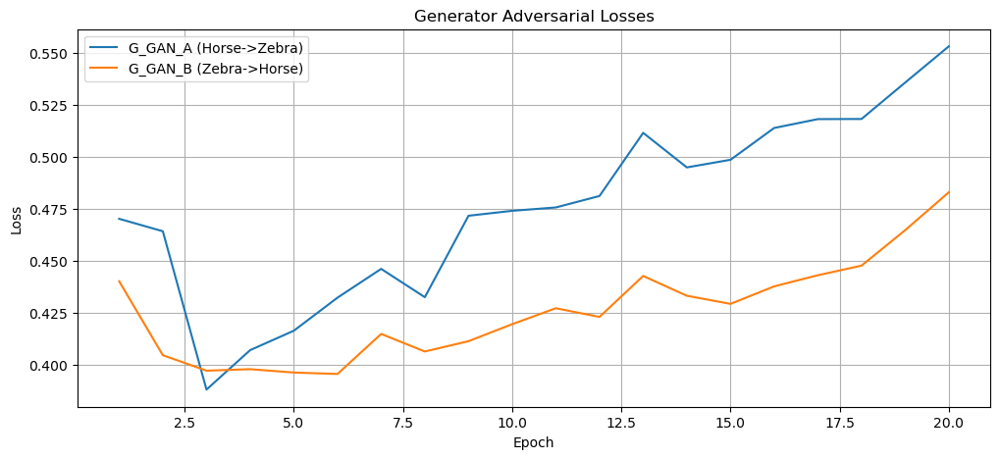

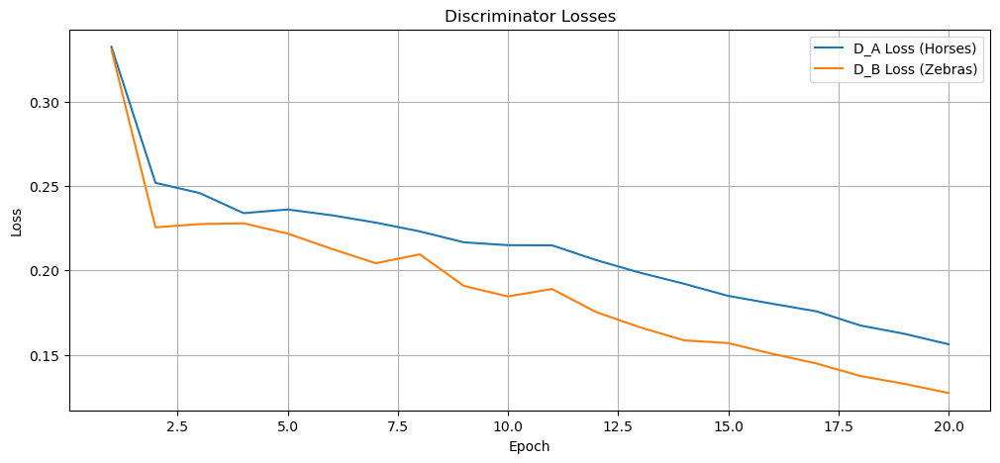

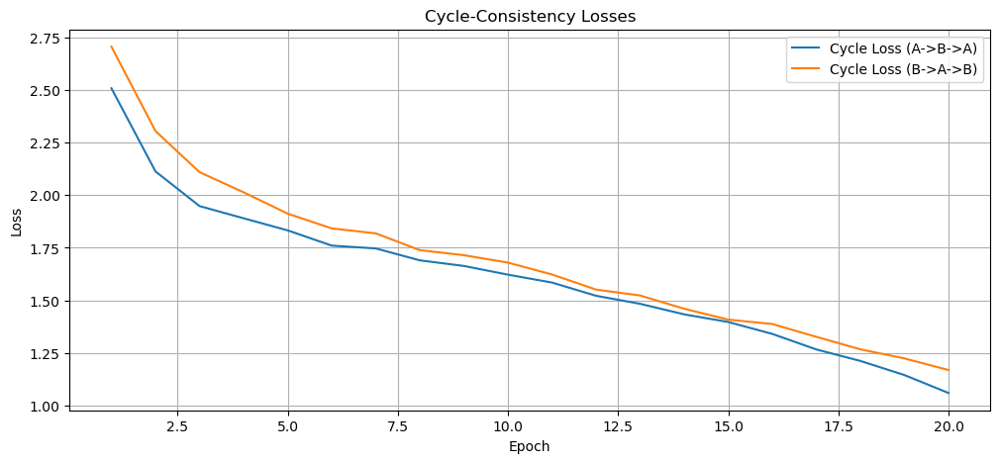

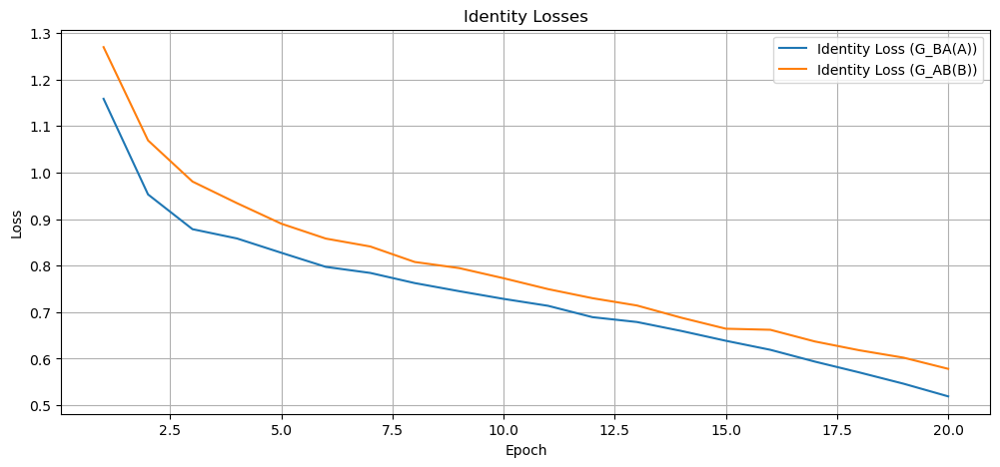

Plotting complete.


In [ ]:
num_trained_epochs = len(loss_history["G_GAN_A"])
epochs = range(1, num_trained_epochs + 1)

print(f"Plotting loss curves for {num_trained_epochs} trained epochs...")

# Plot Generator Losses
plt.figure(figsize=(12, 5))
plt.plot(epochs, loss_history["G_GAN_A"], label="G_GAN_A (Horse->Zebra)")
plt.plot(epochs, loss_history["G_GAN_B"], label="G_GAN_B (Zebra->Horse)")
plt.title("Generator Adversarial Losses")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.show()

# Plot Discriminator Losses
plt.figure(figsize=(12, 5))
plt.plot(epochs, loss_history["D_A"], label="D_A Loss (Horses)")
plt.plot(epochs, loss_history["D_B"], label="D_B Loss (Zebras)")
plt.title("Discriminator Losses")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.show()

# Plot Cycle-Consistency Losses
plt.figure(figsize=(12, 5))
plt.plot(epochs, loss_history["Cycle_A"], label="Cycle Loss (A->B->A)")
plt.plot(epochs, loss_history["Cycle_B"], label="Cycle Loss (B->A->B)")
plt.title("Cycle-Consistency Losses")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.show()

# Plot Identity Losses (Bonus Section)
plt.figure(figsize=(12, 5))
plt.plot(epochs, loss_history["Identity_A"], label="Identity Loss (G_BA(A))")
plt.plot(epochs, loss_history["Identity_B"], label="Identity Loss (G_AB(B))")
plt.title("Identity Losses")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.show()

print("Plotting complete.")

# Step 6: Final Inference on Test Data

This cell performs the final evaluation of the trained CycleGAN model using the held-out test dataset. It executes the following steps:

1.  **Model Loading:** It initializes instances of the Generators ($G_{AB}$ and $G_{BA}$) and loads their trained weights from the saved checkpoint (`latest_checkpoint.pth`). Crucially, `model.eval()` is called to switch the networks to inference mode, which disables layers like Dropout that behave differently during training.
2.  **Test Data Setup:** A new `DataLoader` is created with `mode='test'`. This directs the dataset class to load images from the `testA` and `testB` folders, ensuring the model is evaluated on unseen data.
3.  **Inference:** The code iterates through the test loader. For each sample, it performs a forward pass without gradient calculation (`with torch.no_grad():`) to generate the translated images (Fake Zebra and Fake Horse).
4.  **Visualization:** The real and generated images are denormalized (converted back from $[-1, 1]$ to $[0, 1]$), plotted side-by-side for visual comparison, and saved to the `final_results` directory.

Setting up for final test...
Final models G_AB and G_BA loaded successfully and set to eval mode.
Loaded 140 test images.
Generating translations for 5 test images...


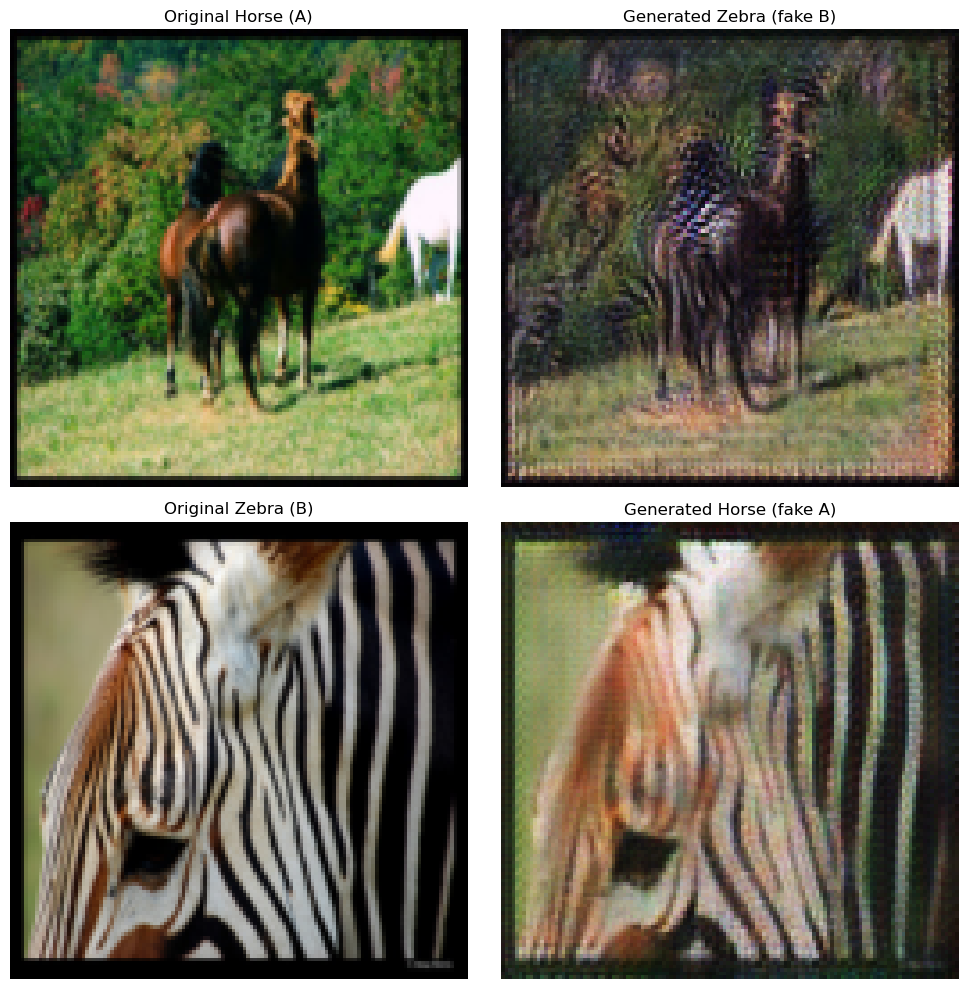

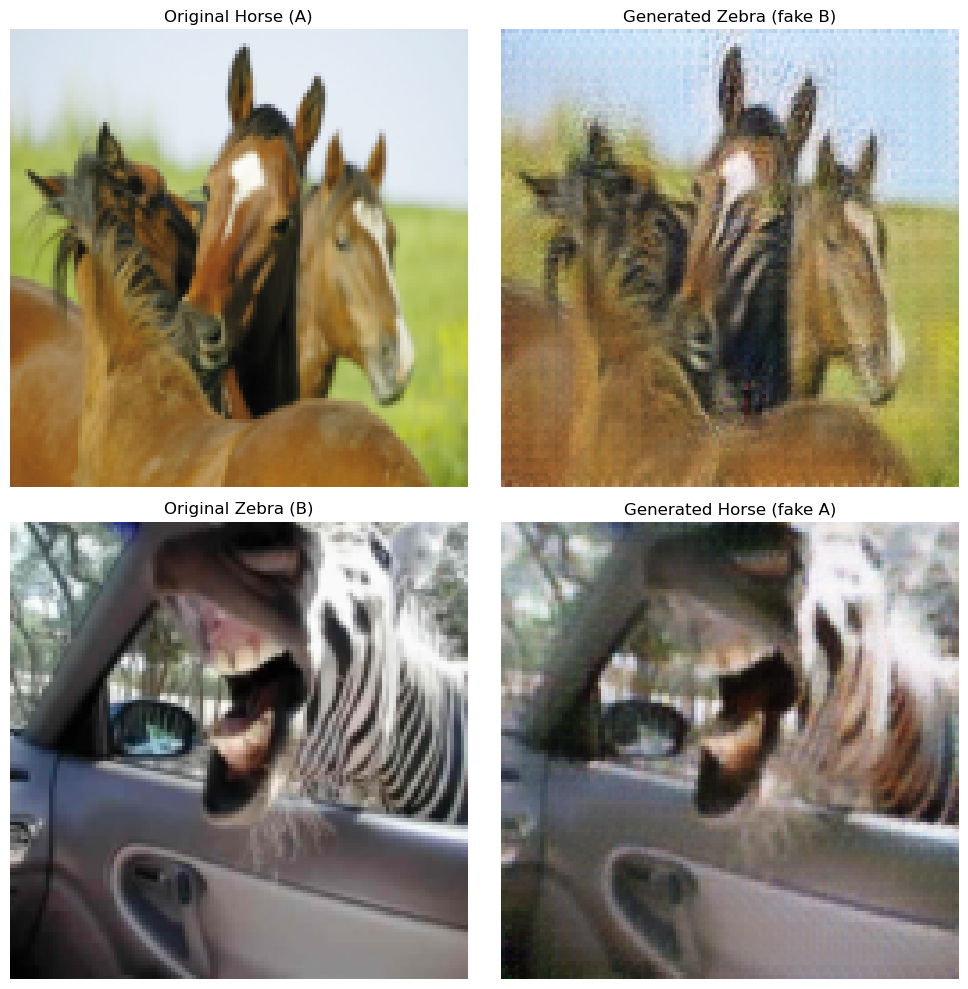

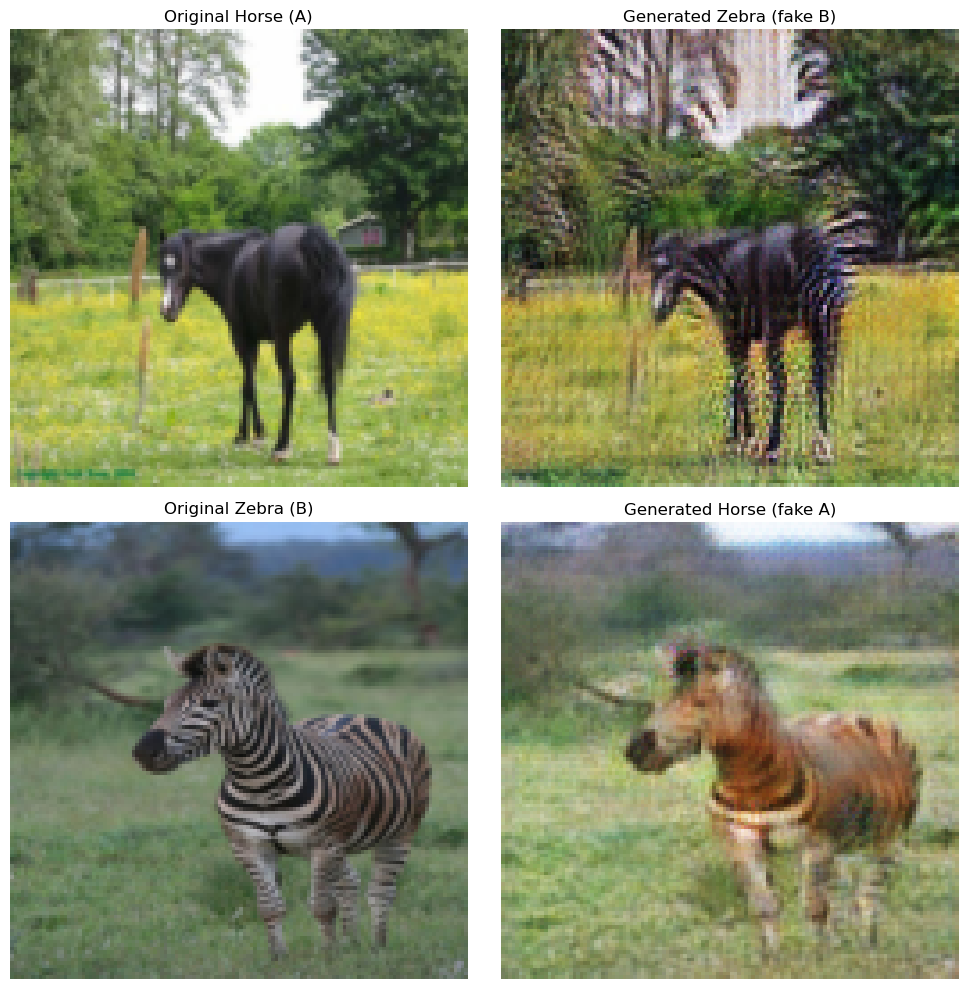

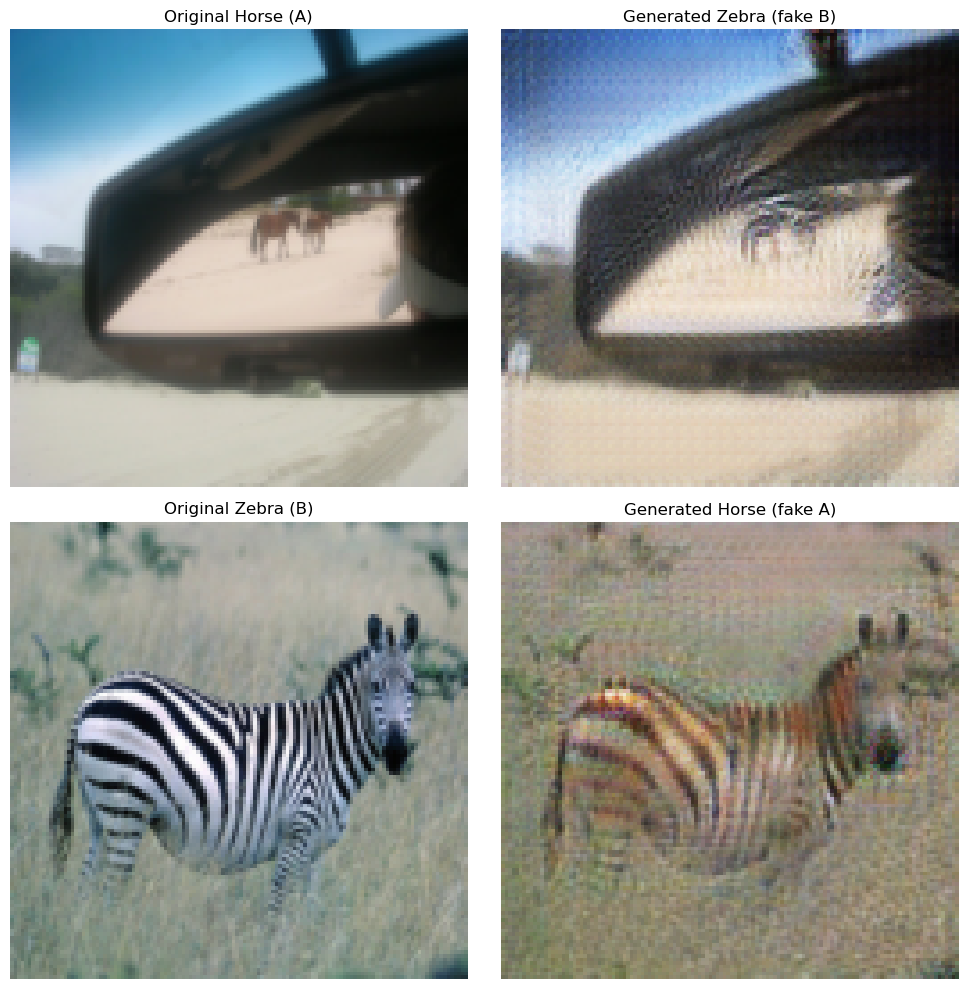

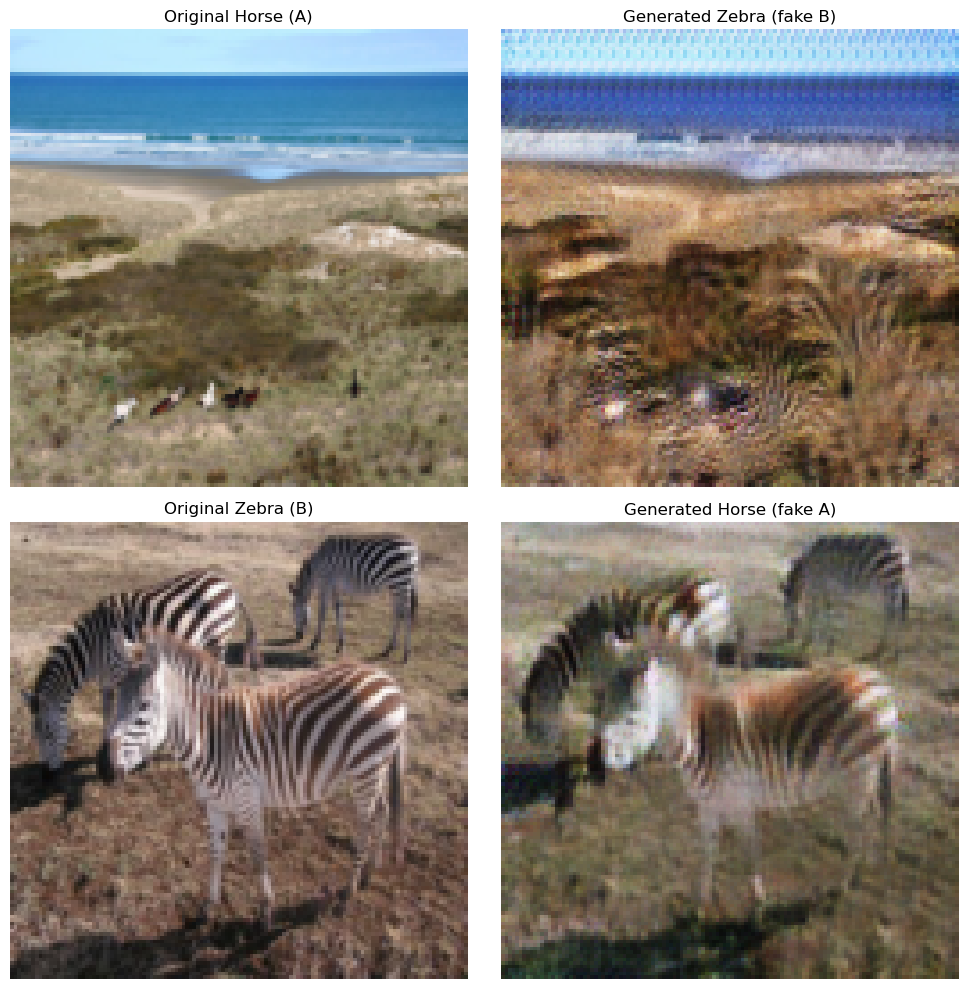

Done! Check the 'final_results/horse2zebra' folder for saved image translations.


In [ ]:
from torchvision import transforms
from torch.utils.data import DataLoader
from PIL import Image


CHECKPOINT_FILE = "checkpoints/horse2zebra/latest_checkpoint.pth"
DATA_DIR = "horse2zebra"
IMG_SIZE = 128
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load Models from Checkpoint
final_G_AB = Generator().to(device)
final_G_BA = Generator().to(device)

checkpoint = torch.load(CHECKPOINT_FILE, map_location=device, weights_only=False)

final_G_AB.load_state_dict(checkpoint['G_AB_state_dict'])
final_G_BA.load_state_dict(checkpoint['G_BA_state_dict'])

# Set models to evaluation mode
final_G_AB.eval()
final_G_BA.eval()

# Create Test DataLoader
test_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
])

try:
    test_dataset = HorseZebraDataset(root_dir=DATA_DIR, transform=test_transform, mode='test')
    test_loader = DataLoader(dataset=test_dataset, batch_size=1, shuffle=False)
except Exception as e:
    print(f"Error: Could not load test dataset: {e}")

# Generate and Plot Results 
results_dir = "final_results/horse2zebra"
os.makedirs(results_dir, exist_ok=True)

num_samples = 5

with torch.no_grad():
    for i, batch in enumerate(test_loader):
        if i >= num_samples:
            break
            
        real_A = batch['A'].to(device) 
        real_B = batch['B'].to(device) 

        fake_B = final_G_AB(real_A) 
        fake_A = final_G_BA(real_B) 

        real_A = denormalize(real_A)
        fake_B = denormalize(fake_B)
        real_B = denormalize(real_B)
        fake_A = denormalize(fake_A)

        fig, axes = plt.subplots(2, 2, figsize=(10, 10))
        
        # Horse -> Zebra
        axes[0, 0].imshow(real_A[0].cpu().permute(1, 2, 0))
        axes[0, 0].set_title("Original Horse (A)")
        axes[0, 0].axis('off')
        
        axes[0, 1].imshow(fake_B[0].cpu().permute(1, 2, 0))
        axes[0, 1].set_title("Generated Zebra (fake B)")
        axes[0, 1].axis('off')

        # Zebra -> Horse
        axes[1, 0].imshow(real_B[0].cpu().permute(1, 2, 0))
        axes[1, 0].set_title("Original Zebra (B)")
        axes[1, 0].axis('off')
        
        axes[1, 1].imshow(fake_A[0].cpu().permute(1, 2, 0))
        axes[1, 1].set_title("Generated Horse (fake A)")
        axes[1, 1].axis('off')

        plt.tight_layout()
        plt.savefig(os.path.join(results_dir, f"test_translation_{i+1}.png"))
        plt.show()

# Step 7: Training Progress Visualization (Static & GIF)

This cell visualizes how the model improves over time using the saved sample images.

1.  **Static Comparison:**
    * The `display_split_epoch` function is defined to load a saved image grid from a specific epoch.
    * It crops the grid to separate the two translation directions: **Horse $\to$ Zebra** (top half) and **Zebra $\to$ Horse** (bottom half).
    * It displays these two directions side-by-side for three key stages: **Initial** (Epoch 1), **Middle** (Epoch 10), and **Final** (Epoch 20). This allows for a clear "Before & After" assessment of the learning process.

2.  **GIF Creation:**
    * The code searches for all saved images matching the pattern `epoch_*.png` in the sample directory.
    * It collects these images and compiles them into an animated **GIF** file (`training_progress.gif`).
    * Finally, it displays the generated GIF directly in the notebook, providing a dynamic view of the model's convergence throughout the training loop.

Displaying static comparison of initial, middle, and final epochs...


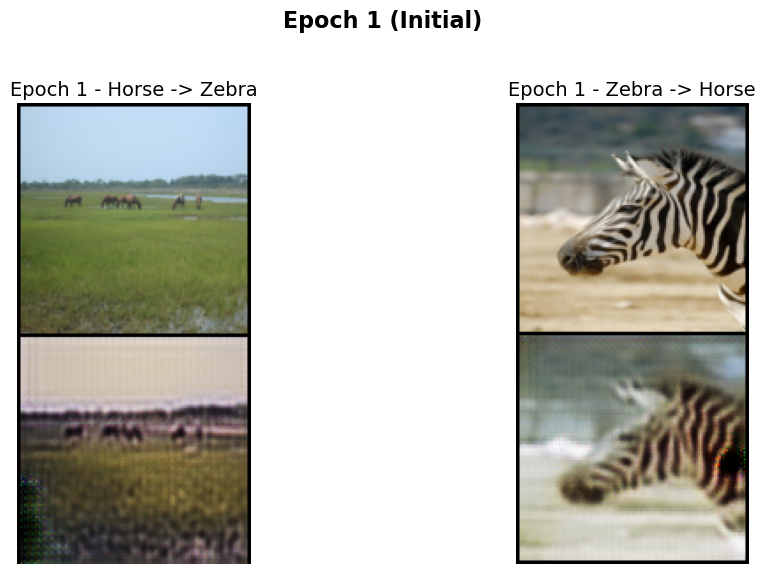

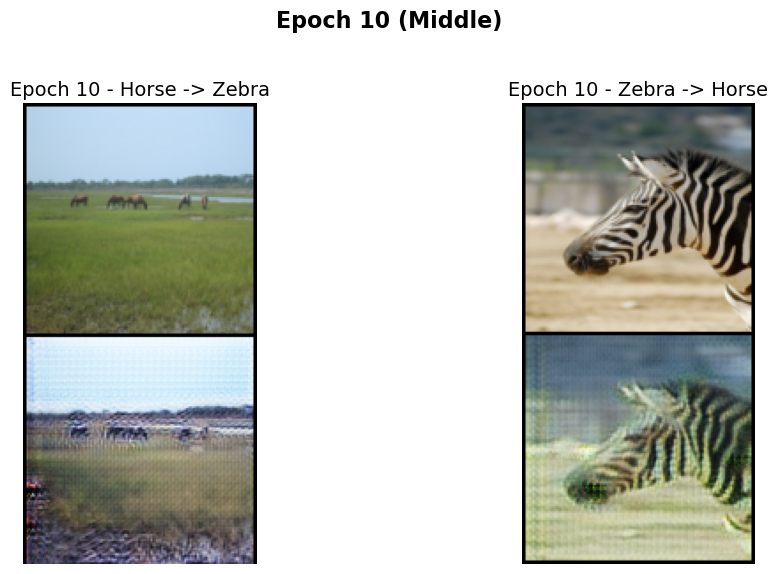

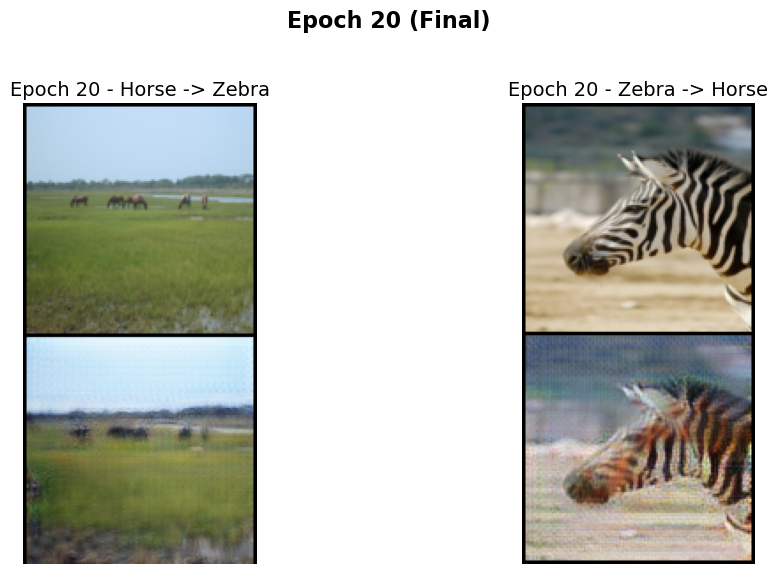

--------------------------------------------------
Creating GIF of training progress...
GIF saved successfully to: sample_images/horse2zebra\training_progress.gif


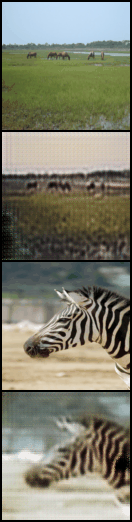

GIF displayed in notebook.
--------------------------------------------------
Finished displaying comparisons and creating GIF.


In [ ]:
from PIL import Image, ImageSequence
import glob 

sample_dir = "sample_images/horse2zebra"
gif_output_path = os.path.join(sample_dir, "training_progress.gif")

epoch_initial = 1
epoch_middle = 10
epoch_final = 20


try:
    def display_split_epoch(epoch_num, title):
        file_path = os.path.join(sample_dir, f"epoch_{epoch_num:03d}.png")
        img = Image.open(file_path)
        
        single_img_height = img.height // 4 
        
        img_top_half = img.crop((0, 0, img.width, single_img_height * 2))
        img_bottom_half = img.crop((0, single_img_height * 2, img.width, img.height))

        fig, axes = plt.subplots(1, 2, figsize=(12, 6))
        
        axes[0].imshow(img_top_half)
        axes[0].set_title(f"Epoch {epoch_num} - Horse -> Zebra", fontsize=14)
        axes[0].axis('off')

        axes[1].imshow(img_bottom_half)
        axes[1].set_title(f"Epoch {epoch_num} - Zebra -> Horse", fontsize=14)
        axes[1].axis('off')
        
        fig.suptitle(title, fontsize=16, fontweight='bold')
        plt.tight_layout(rect=[0, 0.03, 1, 0.95]) 
        plt.show()

    display_split_epoch(epoch_initial, f"Epoch {epoch_initial} (Initial)")
    display_split_epoch(epoch_middle, f"Epoch {epoch_middle} (Middle)")
    display_split_epoch(epoch_final, f"Epoch {epoch_final} (Final)")

except FileNotFoundError as e:
    print(f"Error: Could not find one of the image files for comparison.")
    print(f"Make sure this file exists: {e.filename}")
except Exception as e:
    print(f"An error occurred during static image display: {e}")


image_files = sorted(glob.glob(os.path.join(sample_dir, "epoch_*.png")))

if not image_files:
    print(f"No epoch images found in {sample_dir} to create GIF.")
else:
    images_for_gif = []
    for filename in image_files:
        try:
            images_for_gif.append(Image.open(filename))
        except Exception as e:
            print(f"Warning: Could not open {filename} for GIF. Error: {e}")

    if images_for_gif:
        images_for_gif[0].save(
            gif_output_path,
            save_all=True,
            append_images=images_for_gif[1:],
            duration=300, # 300 milliseconds per frame (adjust for speed)
            loop=0
        )
        
        # Display the GIF in the notebook (requires ipywidgets)
        display(IPyImage(open(gif_output_path,'rb').read()))
    else:
        print("No valid images collected for GIF creation.")

# Step 5a: Setup for Extended Training (Epochs 21-40)

This cell prepares the environment to extend the training process beyond the initial 20 epochs. Its primary goal is to refine the model by resetting the learning rate schedule.

1.  **New Directories:** It defines new directory paths (`sample_images/horse2zebra_40_epochs`) to store the results of this extended run separately, ensuring the original 20-epoch results are preserved.
2.  **Model Loading:** It initializes the Generator and Discriminator networks and loads their weights from the saved checkpoint of the previous run (`latest_checkpoint.pth`). This allows training to resume exactly where it left off.
3.  **Optimizer & Scheduler Reset:** Crucially, instead of loading the old optimizers (which had a learning rate decayed to 0), it creates **new** optimizers and schedulers. This resets the learning rate to `0.0002`, giving the model a fresh "push" to escape local minima and refine details over the next 20 epochs.
4.  **State Restoration:** It retrieves the previous loss history and sets the correct starting epoch (e.g., 21) to maintain continuity in logging.

In [ ]:
import itertools
import time
import datetime
import torchvision.utils as vutils
from tqdm.notebook import tqdm

sample_dir_40 = "sample_images/horse2zebra_40_epochs"
checkpoint_dir_40 = "checkpoints/horse2zebra_40_epochs"
CHECKPOINT_FILE_40 = os.path.join(checkpoint_dir_40, "latest_checkpoint.pth")
os.makedirs(sample_dir_40, exist_ok=True)
os.makedirs(checkpoint_dir_40, exist_ok=True)

CHECKPOINT_FILE_ORIGINAL = "checkpoints/horse2zebra/latest_checkpoint.pth"

N_EPOCHS_NEW = 20
DECAY_START_EPOCH_NEW = 10 
LR = 0.0002 
LAMBDA_CYCLE = 10.0
LAMBDA_IDENTITY = 0.5 * LAMBDA_CYCLE

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

G_AB = Generator().to(device)
G_BA = Generator().to(device)
D_A = Discriminator().to(device)
D_B = Discriminator().to(device)

try:
    checkpoint_original = torch.load(CHECKPOINT_FILE_ORIGINAL, map_location=device, weights_only=False)
    
    G_AB.load_state_dict(checkpoint_original['G_AB_state_dict'])
    G_BA.load_state_dict(checkpoint_original['G_BA_state_dict'])
    D_A.load_state_dict(checkpoint_original['D_A_state_dict'])
    D_B.load_state_dict(checkpoint_original['D_B_state_dict'])
    
    loss_history_40 = checkpoint_original['loss_history']
    start_epoch = checkpoint_original['epoch'] + 1
    
except Exception as e:
    print(f"Error: Could not load original checkpoint. {e}")
    raise

optimizer_G_new = optim.Adam(itertools.chain(G_AB.parameters(), G_BA.parameters()), lr=LR, betas=(0.5, 0.999))
optimizer_D_new = optim.Adam(itertools.chain(D_A.parameters(), D_B.parameters()), lr=LR, betas=(0.5, 0.999))

def lambda_rule_new(epoch): 
    total_decay_epochs = N_EPOCHS_NEW - DECAY_START_EPOCH_NEW
    if total_decay_epochs <= 0: return 1.0
    offset = max(0, epoch - DECAY_START_EPOCH_NEW) 
    return 1.0 - (offset / float(total_decay_epochs))

scheduler_G_new = optim.lr_scheduler.LambdaLR(optimizer_G_new, lr_lambda=lambda_rule_new)
scheduler_D_new = optim.lr_scheduler.LambdaLR(optimizer_D_new, lr_lambda=lambda_rule_new)

fake_A_buffer = ImageHistoryBuffer()
fake_B_buffer = ImageHistoryBuffer()

fixed_batch = next(iter(train_loader))
fixed_A = fixed_batch['A'].to(device)
fixed_B = fixed_batch['B'].to(device)

New samples will be saved to: sample_images/horse2zebra_40_epochs
New checkpoints will be saved to: checkpoints/horse2zebra_40_epochs
Loading weights from original 20-epoch run: checkpoints/horse2zebra/latest_checkpoint.pth
Model weights loaded successfully.
Creating NEW optimizers and schedulers to reset LR...
--- Setup complete. Ready to train from Epoch 21 to 40 ---


# Step 5b: Extended Training Loop (Epochs 21-40)

This cell executes the extended training phase to further refine the model's performance.

1.  **Continuation Loop:** It runs from `start_epoch` (e.g., 21) to `N_EPOCHS_TARGET` (e.g., 40).
2.  **Training Process:** Similar to the initial training loop, it iterates through the dataset, computing adversarial, cycle-consistency, and identity losses, and updating the network weights.
3.  **Loss Tracking:** It appends the new loss values to the existing `loss_history_40` dictionary, ensuring a continuous record of training metrics from epoch 1 to 40.
4.  **Visualization & Saving:** At the end of each epoch, it generates and saves sample images to the new `sample_images/horse2zebra_40_epochs` directory. Crucially, it saves model checkpoints every 5 epochs to `checkpoints/horse2zebra_40_epochs`, keeping the extended training results separate from the initial run.

In [ ]:
N_EPOCHS_TARGET = start_epoch + N_EPOCHS_NEW - 1

start_time = time.time()

for epoch in range(start_epoch, N_EPOCHS_TARGET + 1):
    G_AB.train(); G_BA.train(); D_A.train(); D_B.train()
    
    epoch_relative = epoch - start_epoch + 1 
    
    epoch_losses = {k: [] for k in loss_history_40.keys()}
    progress_bar = tqdm(enumerate(train_loader), total=len(train_loader), desc=f"Epoch {epoch}/{N_EPOCHS_TARGET}", leave=False)
    
    for i, batch in progress_bar:
        real_A = batch['A'].to(device); real_B = batch['B'].to(device)
        
        optimizer_G_new.zero_grad()
        
        identity_B = G_AB(real_B); loss_identity_B = loss_identity(identity_B, real_B) * LAMBDA_IDENTITY
        identity_A = G_BA(real_A); loss_identity_A = loss_identity(identity_A, real_A) * LAMBDA_IDENTITY
        
        fake_B = G_AB(real_A); pred_fake_B = D_B(fake_B)
        target_real = torch.tensor(1.0).expand_as(pred_fake_B).to(device)
        loss_G_GAN_A = loss_GAN(pred_fake_B, target_real)
        
        fake_A = G_BA(real_B); pred_fake_A = D_A(fake_A)
        loss_G_GAN_B = loss_GAN(pred_fake_A, target_real)
        
        recon_A = G_BA(fake_B); loss_cycle_A = loss_cycle(recon_A, real_A) * LAMBDA_CYCLE
        recon_B = G_AB(fake_A); loss_cycle_B = loss_cycle(recon_B, real_B) * LAMBDA_CYCLE
        
        loss_G = loss_G_GAN_A + loss_G_GAN_B + loss_cycle_A + loss_cycle_B + loss_identity_A + loss_identity_B
        loss_G.backward()
        optimizer_G_new.step()
        
        optimizer_D_new.zero_grad()
        
        pred_real_A = D_A(real_A); loss_D_real_A = loss_GAN(pred_real_A, target_real)
        fake_A_buffered = fake_A_buffer.query(fake_A)
        pred_fake_A = D_A(fake_A_buffered.detach())
        target_fake = torch.tensor(0.0).expand_as(pred_fake_A).to(device)
        loss_D_fake_A = loss_GAN(pred_fake_A, target_fake)
        loss_D_A = (loss_D_real_A + loss_D_fake_A) * 0.5
        loss_D_A.backward()
        
        pred_real_B = D_B(real_B); loss_D_real_B = loss_GAN(pred_real_B, target_real)
        fake_B_buffered = fake_B_buffer.query(fake_B)
        pred_fake_B = D_B(fake_B_buffered.detach())
        loss_D_fake_B = loss_GAN(pred_fake_B, target_fake)
        loss_D_B = (loss_D_real_B + loss_D_fake_B) * 0.5
        loss_D_B.backward()
        
        optimizer_D_new.step()
        
        epoch_losses["G_GAN_A"].append(loss_G_GAN_A.item()); epoch_losses["G_GAN_B"].append(loss_G_GAN_B.item())
        epoch_losses["D_A"].append(loss_D_A.item()); epoch_losses["D_B"].append(loss_D_B.item())
        epoch_losses["Cycle_A"].append(loss_cycle_A.item()); epoch_losses["Cycle_B"].append(loss_cycle_B.item())
        epoch_losses["Identity_A"].append(loss_identity_A.item()); epoch_losses["Identity_B"].append(loss_identity_B.item())

    scheduler_G_new.step(epoch_relative) 
    scheduler_D_new.step(epoch_relative)
    
    G_AB.eval(); G_BA.eval()
    with torch.no_grad():
        fake_B_sample = G_AB(fixed_A)
        fake_A_sample = G_BA(fixed_B)
        grid = torch.cat((denormalize(fixed_A), denormalize(fake_B_sample),
                          denormalize(fixed_B), denormalize(fake_A_sample)), dim=0)
        vutils.save_image(grid, os.path.join(sample_dir_40, f"epoch_{epoch:03d}.png"), nrow=BATCH_SIZE, normalize=False)
        
    for key in loss_history_40.keys():
        loss_history_40[key].append(np.mean(epoch_losses[key]))
        
    print_msg = f"Epoch {epoch}/{N_EPOCHS_TARGET} [D_A: {loss_history_40['D_A'][-1]:.4f}] [D_B: {loss_history_40['D_B'][-1]:.4f}] "
    print_msg += f"[G_GAN: {(loss_history_40['G_GAN_A'][-1] + loss_history_40['G_GAN_B'][-1]):.4f}] "
    print_msg += f"[Cycle: {(loss_history_40['Cycle_A'][-1] + loss_history_40['Cycle_B'][-1]):.4F}] "
    print_msg += f"[Identity: {(loss_history_40['Identity_A'][-1] + loss_history_40['Identity_B'][-1]):.4f}] "
    print_msg += f"LR: {optimizer_G_new.param_groups[0]['lr']:.6f}"
    print(print_msg)

    if (epoch_relative % 5 == 0) or (epoch == N_EPOCHS_TARGET):
        print(f"--- Saving checkpoint for epoch {epoch} to {CHECKPOINT_FILE_40} ---")
        checkpoint = {
            'epoch': epoch,
            'G_AB_state_dict': G_AB.state_dict(),
            'G_BA_state_dict': G_BA.state_dict(),
            'D_A_state_dict': D_A.state_dict(),
            'D_B_state_dict': D_B.state_dict(),
            'optimizer_G_state_dict': optimizer_G_new.state_dict(),
            'optimizer_D_state_dict': optimizer_D_new.state_dict(),
            'scheduler_G_state_dict': scheduler_G_new.state_dict(),
            'scheduler_D_state_dict': scheduler_D_new.state_dict(),
            'loss_history': loss_history_40
        }
        torch.save(checkpoint, CHECKPOINT_FILE_40)
    
total_time = time.time() - start_time

--- Starting continuation training from Epoch 21 ---


Epoch 21/40:   0%|          | 0/1334 [00:00<?, ?it/s]

Epoch 21/40 [D_A: 0.2024] [D_B: 0.1650] [G_GAN: 1.0140] [Cycle: 2.9069] [Identity: 1.3125] LR: 0.000200


c:\Users\USER\miniconda3\envs\DGM\Lib\site-packages\torch\optim\lr_scheduler.py:240: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 22/40:   0%|          | 0/1334 [00:00<?, ?it/s]

Epoch 22/40 [D_A: 0.1973] [D_B: 0.1738] [G_GAN: 0.9673] [Cycle: 2.8319] [Identity: 1.2867] LR: 0.000200


Epoch 23/40:   0%|          | 0/1334 [00:00<?, ?it/s]

Epoch 23/40 [D_A: 0.1929] [D_B: 0.1625] [G_GAN: 0.9852] [Cycle: 2.8244] [Identity: 1.2785] LR: 0.000200


Epoch 24/40:   0%|          | 0/1334 [00:00<?, ?it/s]

Epoch 24/40 [D_A: 0.1875] [D_B: 0.1588] [G_GAN: 1.0030] [Cycle: 2.8450] [Identity: 1.2758] LR: 0.000200


Epoch 25/40:   0%|          | 0/1334 [00:00<?, ?it/s]

Epoch 25/40 [D_A: 0.1867] [D_B: 0.1572] [G_GAN: 0.9857] [Cycle: 2.7922] [Identity: 1.2555] LR: 0.000200
--- Saving checkpoint for epoch 25 to checkpoints/horse2zebra_40_epochs\latest_checkpoint.pth ---


Epoch 26/40:   0%|          | 0/1334 [00:00<?, ?it/s]

Epoch 26/40 [D_A: 0.1830] [D_B: 0.1531] [G_GAN: 1.0214] [Cycle: 2.7144] [Identity: 1.2245] LR: 0.000200


Epoch 27/40:   0%|          | 0/1334 [00:00<?, ?it/s]

Epoch 27/40 [D_A: 0.1903] [D_B: 0.1527] [G_GAN: 0.9943] [Cycle: 2.7103] [Identity: 1.2202] LR: 0.000200


Epoch 28/40:   0%|          | 0/1334 [00:00<?, ?it/s]

Epoch 28/40 [D_A: 0.1872] [D_B: 0.1524] [G_GAN: 0.9855] [Cycle: 2.6771] [Identity: 1.2104] LR: 0.000200


Epoch 29/40:   0%|          | 0/1334 [00:00<?, ?it/s]

Epoch 29/40 [D_A: 0.1825] [D_B: 0.1448] [G_GAN: 1.0056] [Cycle: 2.6264] [Identity: 1.1824] LR: 0.000200


Epoch 30/40:   0%|          | 0/1334 [00:00<?, ?it/s]

Epoch 30/40 [D_A: 0.1801] [D_B: 0.1497] [G_GAN: 1.0343] [Cycle: 2.6395] [Identity: 1.1847] LR: 0.000200
--- Saving checkpoint for epoch 30 to checkpoints/horse2zebra_40_epochs\latest_checkpoint.pth ---


Epoch 31/40:   0%|          | 0/1334 [00:00<?, ?it/s]

Epoch 31/40 [D_A: 0.1818] [D_B: 0.1444] [G_GAN: 1.0228] [Cycle: 2.5768] [Identity: 1.1521] LR: 0.000180


Epoch 32/40:   0%|          | 0/1334 [00:00<?, ?it/s]

Epoch 32/40 [D_A: 0.1686] [D_B: 0.1326] [G_GAN: 1.0562] [Cycle: 2.5327] [Identity: 1.1446] LR: 0.000160


Epoch 33/40:   0%|          | 0/1334 [00:00<?, ?it/s]

Epoch 33/40 [D_A: 0.1646] [D_B: 0.1301] [G_GAN: 1.0725] [Cycle: 2.4257] [Identity: 1.0856] LR: 0.000140


Epoch 34/40:   0%|          | 0/1334 [00:00<?, ?it/s]

Epoch 34/40 [D_A: 0.1608] [D_B: 0.1218] [G_GAN: 1.0806] [Cycle: 2.3332] [Identity: 1.0557] LR: 0.000120


Epoch 35/40:   0%|          | 0/1334 [00:00<?, ?it/s]

Epoch 35/40 [D_A: 0.1559] [D_B: 0.1216] [G_GAN: 1.1005] [Cycle: 2.2546] [Identity: 1.0259] LR: 0.000100
--- Saving checkpoint for epoch 35 to checkpoints/horse2zebra_40_epochs\latest_checkpoint.pth ---


Epoch 36/40:   0%|          | 0/1334 [00:00<?, ?it/s]

Epoch 36/40 [D_A: 0.1487] [D_B: 0.1154] [G_GAN: 1.0992] [Cycle: 2.1697] [Identity: 1.0016] LR: 0.000080


Epoch 37/40:   0%|          | 0/1334 [00:00<?, ?it/s]

Epoch 37/40 [D_A: 0.1476] [D_B: 0.1097] [G_GAN: 1.1216] [Cycle: 2.0983] [Identity: 0.9634] LR: 0.000060


Epoch 38/40:   0%|          | 0/1334 [00:00<?, ?it/s]

Epoch 38/40 [D_A: 0.1388] [D_B: 0.1068] [G_GAN: 1.1352] [Cycle: 2.0127] [Identity: 0.9354] LR: 0.000040


Epoch 39/40:   0%|          | 0/1334 [00:00<?, ?it/s]

Epoch 39/40 [D_A: 0.1354] [D_B: 0.1024] [G_GAN: 1.1494] [Cycle: 1.9455] [Identity: 0.9148] LR: 0.000020


Epoch 40/40:   0%|          | 0/1334 [00:00<?, ?it/s]

Epoch 40/40 [D_A: 0.1304] [D_B: 0.1007] [G_GAN: 1.1612] [Cycle: 1.8706] [Identity: 0.8906] LR: 0.000000
--- Saving checkpoint for epoch 40 to checkpoints/horse2zebra_40_epochs\latest_checkpoint.pth ---
--- Continuation Training Finished in 1:38:54.896325 ---


# Step 8: Comprehensive Analysis (Epoch 20 vs. Epoch 40)

This cell performs a detailed comparative analysis of the initial training phase (20 epochs) versus the extended training phase (40 epochs).

1.  **Loss Curve Visualization (Extended):**
    * Loads the loss history from the 40-epoch checkpoint.
    * Plots the full progression of Adversarial, Cycle-Consistency, and Identity losses over all 40 epochs. This allows us to observe long-term convergence and stability trends that weren't visible in the shorter run.

2.  **Side-by-Side Model Comparison:**
    * Loads **both** the 20-epoch model and the 40-epoch model into memory simultaneously.
    * Runs both models on the same batch of test images.
    * Displays a direct visual comparison: **[Original Image] | [Epoch 20 Result] | [Epoch 40 Result]**. This provides concrete evidence of the qualitative improvements gained by extended training (e.g., sharper textures, fewer artifacts).

3.  **Extended Progress GIF:**
    * Compiles a new GIF animation using the sample images generated during the second phase of training (epochs 21-40), visualizing the fine-tuning process.

--- Part 1: Plotting 40-Epoch Loss History ---
Successfully loaded 40 epochs of history.


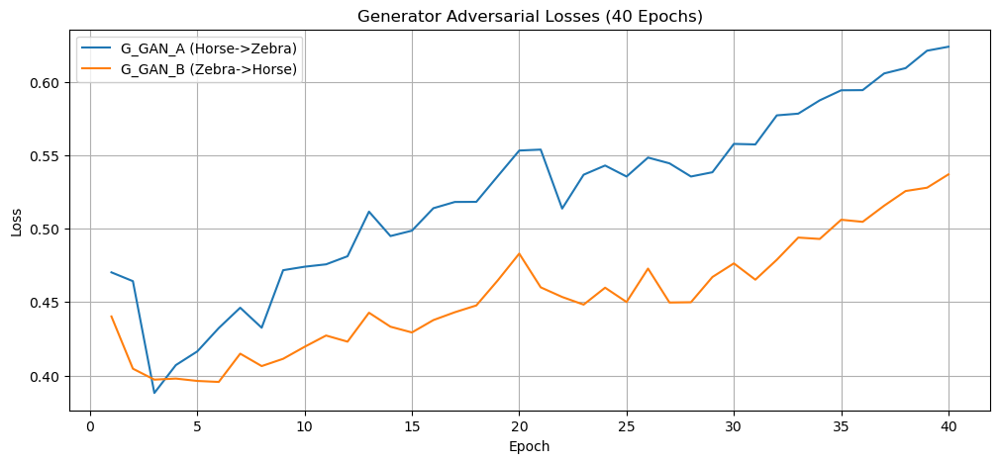

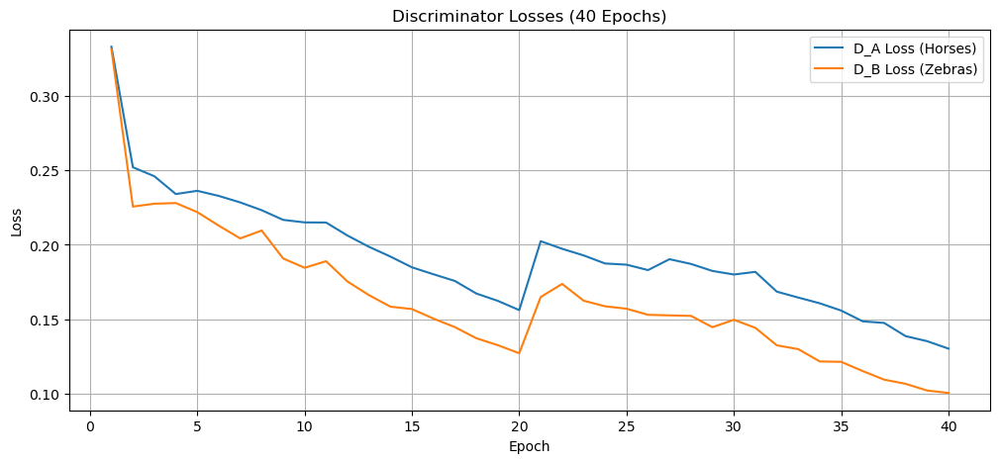

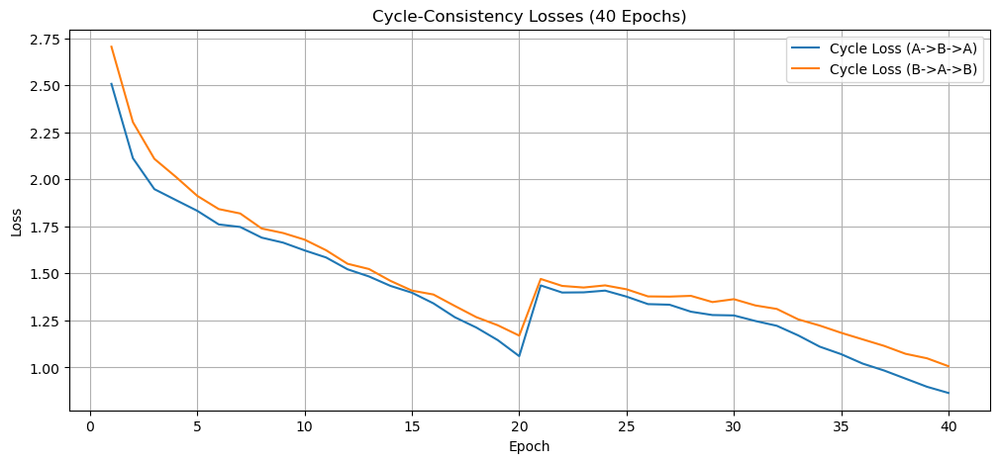

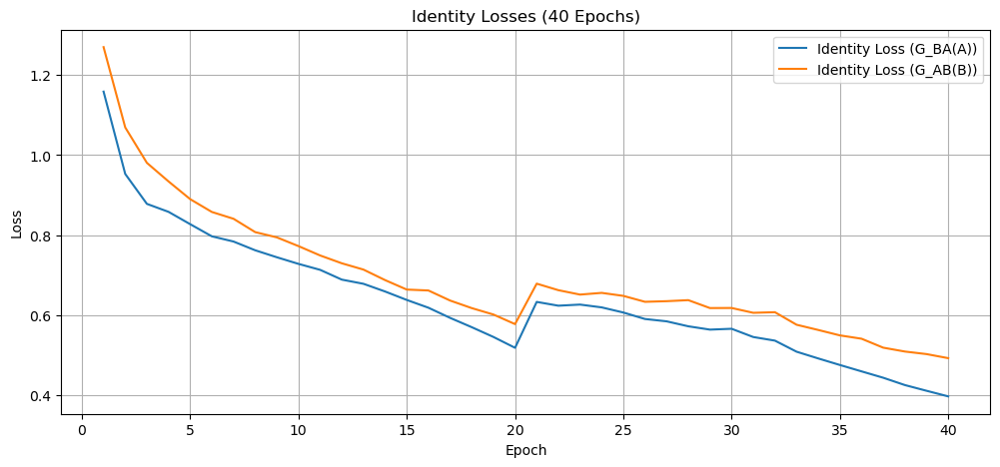

Loss plotting complete.
--------------------------------------------------
--- Part 2: Generating 'Before (20 Epoch)' vs 'After (40 Epoch)' Comparison ---
Loaded 20-epoch models.
Loaded 40-epoch models.
Loaded 140 test images.
Generating side-by-side comparison for 3 test images...


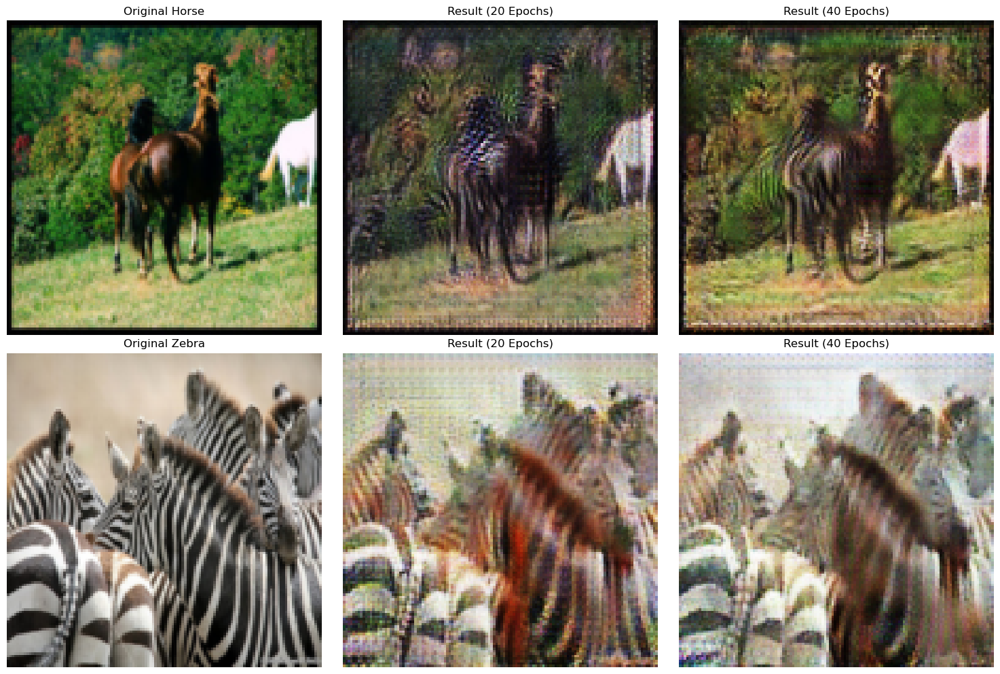

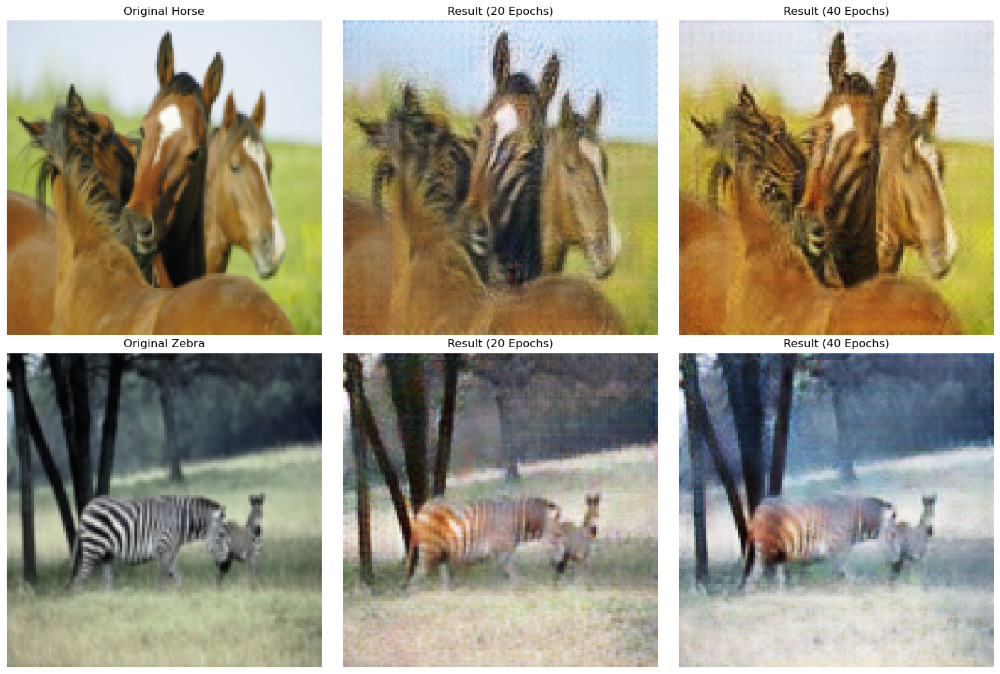

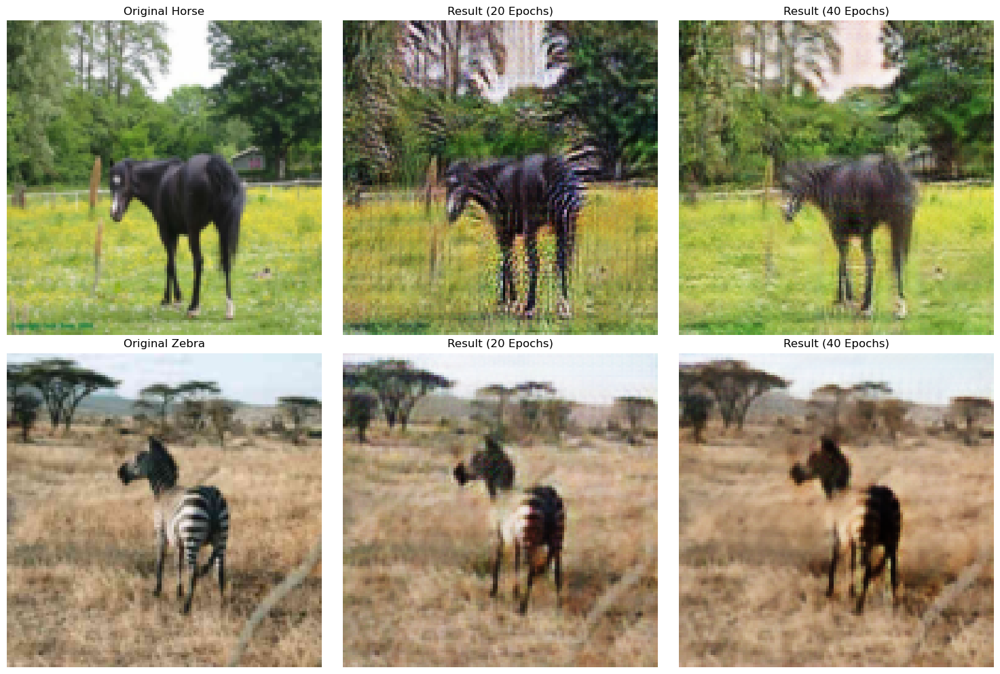

--------------------------------------------------
--- Part 3: Creating GIF from Epochs 21-40 ---
New GIF saved successfully to: sample_images/horse2zebra_40_epochs\training_progress_40_epochs.gif


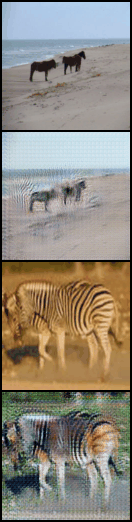

New GIF displayed.

--- Final Analysis Complete ---


In [ ]:
from PIL import Image, ImageSequence
from IPython.display import Image as IPyImage, display

CHECKPOINT_FILE_20 = "checkpoints/horse2zebra/latest_checkpoint.pth"
CHECKPOINT_FILE_40 = "checkpoints/horse2zebra_40_epochs/latest_checkpoint.pth"
sample_dir_40 = "sample_images/horse2zebra_40_epochs"
gif_output_path_40 = os.path.join(sample_dir_40, "training_progress_40_epochs.gif")
DATA_DIR = "horse2zebra"
IMG_SIZE = 128
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

try:
    checkpoint_40 = torch.load(CHECKPOINT_FILE_40, map_location='cpu', weights_only=False)
    loss_history_40 = checkpoint_40['loss_history']
    num_total_epochs = checkpoint_40['epoch']
    epochs = range(1, num_total_epochs + 1)
    print(f"Successfully loaded {num_total_epochs} epochs of history.")

    plt.figure(figsize=(12, 5)); plt.plot(epochs, loss_history_40["G_GAN_A"], label="G_GAN_A (Horse->Zebra)"); plt.plot(epochs, loss_history_40["G_GAN_B"], label="G_GAN_B (Zebra->Horse)"); plt.title("Generator Adversarial Losses (40 Epochs)"); plt.xlabel("Epoch"); plt.ylabel("Loss"); plt.legend(); plt.grid(True); plt.show()
    plt.figure(figsize=(12, 5)); plt.plot(epochs, loss_history_40["D_A"], label="D_A Loss (Horses)"); plt.plot(epochs, loss_history_40["D_B"], label="D_B Loss (Zebras)"); plt.title("Discriminator Losses (40 Epochs)"); plt.xlabel("Epoch"); plt.ylabel("Loss"); plt.legend(); plt.grid(True); plt.show()
    plt.figure(figsize=(12, 5)); plt.plot(epochs, loss_history_40["Cycle_A"], label="Cycle Loss (A->B->A)"); plt.plot(epochs, loss_history_40["Cycle_B"], label="Cycle Loss (B->A->B)"); plt.title("Cycle-Consistency Losses (40 Epochs)"); plt.xlabel("Epoch"); plt.ylabel("Loss"); plt.legend(); plt.grid(True); plt.show()

    plt.figure(figsize=(12, 5)); plt.plot(epochs, loss_history_40["Identity_A"], label="Identity Loss (G_BA(A))"); plt.plot(epochs, loss_history_40["Identity_B"], label="Identity Loss (G_AB(B))"); plt.title("Identity Losses (40 Epochs)"); plt.xlabel("Epoch"); plt.ylabel("Loss"); plt.legend(); plt.grid(True); plt.show()
    print("Loss plotting complete.")

except Exception as e:
    print(f"Error loading 40-epoch checkpoint or plotting: {e}")

try:
    G_AB_20 = Generator().to(device); G_BA_20 = Generator().to(device)
    checkpoint_20 = torch.load(CHECKPOINT_FILE_20, map_location=device, weights_only=False)
    G_AB_20.load_state_dict(checkpoint_20['G_AB_state_dict'])
    G_BA_20.load_state_dict(checkpoint_20['G_BA_state_dict'])
    G_AB_20.eval(); G_BA_20.eval()
    print("Loaded 20-epoch models.")

    G_AB_40 = Generator().to(device); G_BA_40 = Generator().to(device)
    checkpoint_40 = torch.load(CHECKPOINT_FILE_40, map_location=device, weights_only=False)
    G_AB_40.load_state_dict(checkpoint_40['G_AB_state_dict'])
    G_BA_40.load_state_dict(checkpoint_40['G_BA_state_dict'])
    G_AB_40.eval(); G_BA_40.eval()
    print("Loaded 40-epoch models.")

    test_transform = transforms.Compose([
        transforms.Resize((IMG_SIZE, IMG_SIZE)),
        transforms.ToTensor(),
        transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
    ])
    test_dataset = HorseZebraDataset(root_dir=DATA_DIR, transform=test_transform, mode='test')
    test_loader = DataLoader(dataset=test_dataset, batch_size=1, shuffle=False)
    print(f"Loaded {len(test_dataset)} test images.")

    num_samples = 3
    print(f"Generating side-by-side comparison for {num_samples} test images...")
    with torch.no_grad():
        for i, batch in enumerate(test_loader):
            if i >= num_samples: break
            
            real_A = batch['A'].to(device) # Real Horse
            real_B = batch['B'].to(device) # Real Zebra

            fake_B_20 = G_AB_20(real_A)
            fake_B_40 = G_AB_40(real_A)
            
            fake_A_20 = G_BA_20(real_B)
            fake_A_40 = G_BA_40(real_B)

            images = [denormalize(img[0].cpu()) for img in [real_A, fake_B_20, fake_B_40, real_B, fake_A_20, fake_A_40]]

            fig, axes = plt.subplots(2, 3, figsize=(15, 10))
            
            axes[0, 0].imshow(images[0].permute(1, 2, 0)); axes[0, 0].set_title("Original Horse"); axes[0, 0].axis('off')
            axes[0, 1].imshow(images[1].permute(1, 2, 0)); axes[0, 1].set_title("Result (20 Epochs)"); axes[0, 1].axis('off')
            axes[0, 2].imshow(images[2].permute(1, 2, 0)); axes[0, 2].set_title("Result (40 Epochs)"); axes[0, 2].axis('off')
            
            axes[1, 0].imshow(images[3].permute(1, 2, 0)); axes[1, 0].set_title("Original Zebra"); axes[1, 0].axis('off')
            axes[1, 1].imshow(images[4].permute(1, 2, 0)); axes[1, 1].set_title("Result (20 Epochs)"); axes[1, 1].axis('off')
            axes[1, 2].imshow(images[5].permute(1, 2, 0)); axes[1, 2].set_title("Result (40 Epochs)"); axes[1, 2].axis('off')

            plt.tight_layout()
            plt.show()

except Exception as e:
    print(f"An error occurred during 'Before/After' comparison: {e}")

try:
    image_files = sorted(glob.glob(os.path.join(sample_dir_40, "epoch_*.png")))
    if not image_files:
        print(f"No epoch images found in {sample_dir_40} to create GIF.")
    else:
        images_for_gif = [Image.open(filename) for filename in image_files]
        if images_for_gif:
            images_for_gif[0].save(
                gif_output_path_40,
                save_all=True,
                append_images=images_for_gif[1:],
                duration=300,
                loop=0
            )
            display(IPyImage(open(gif_output_path_40,'rb').read()))
        else:
            print("No valid images collected for new GIF.")
except Exception as e:
    print(f"An error occurred during GIF creation: {e}")


# Step 10: Randomized Evaluation with the Final Model (Epoch 40)

This cell demonstrates the performance of the fully trained model (after 40 epochs) on random samples from the test set.

1.  **Model Loading:** It initializes the generator networks and loads the weights from the **40-epoch checkpoint** (`latest_checkpoint.pth`), ensuring we are testing the most refined version of the model.
2.  **Random Data Sampling:** The test `DataLoader` is configured with `shuffle=True`. This is crucial for exploration, as it allows you to see a fresh set of **5 random test images** every time you run this cell, rather than always seeing the first few images.
3.  **Inference:** It performs a forward pass to translate images in both directions (Horse $\to$ Zebra and Zebra $\to$ Horse) without calculating gradients.
4.  **Visualization:** The results are denormalized and plotted side-by-side to qualitatively assess how well the model handles various poses, backgrounds, and lighting conditions.

Setting up for RANDOMIZED final test...
Loaded 40-epoch models.
Loaded 140 test images (shuffled).
Generating translations for 5 RANDOM test images...


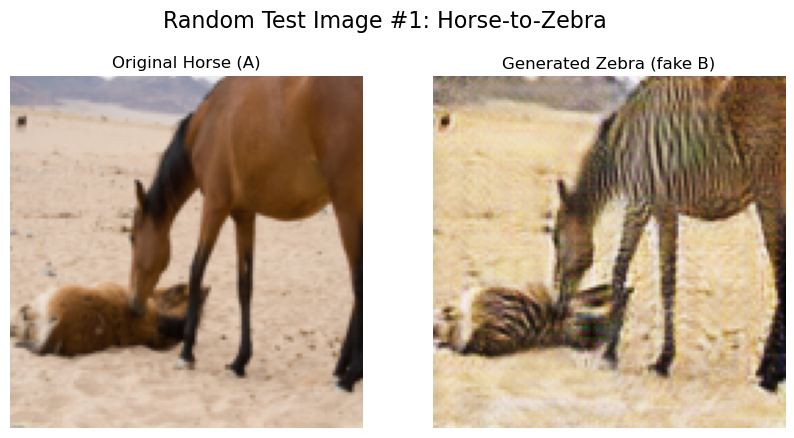

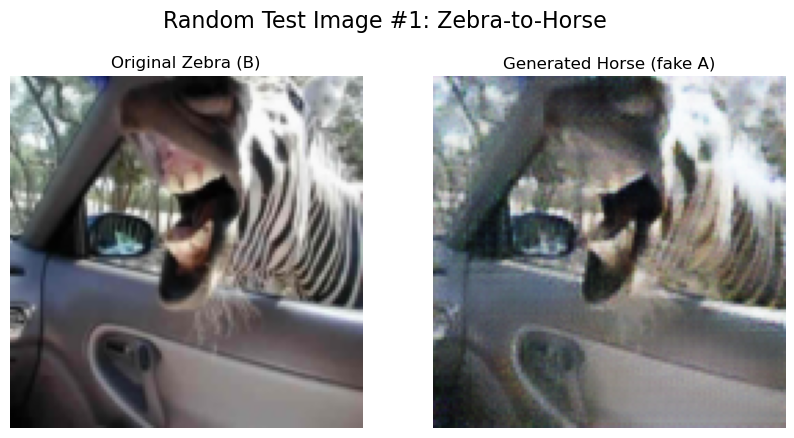

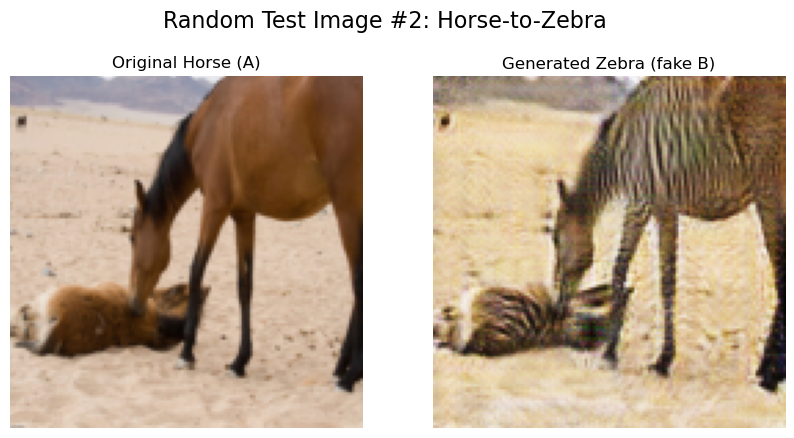

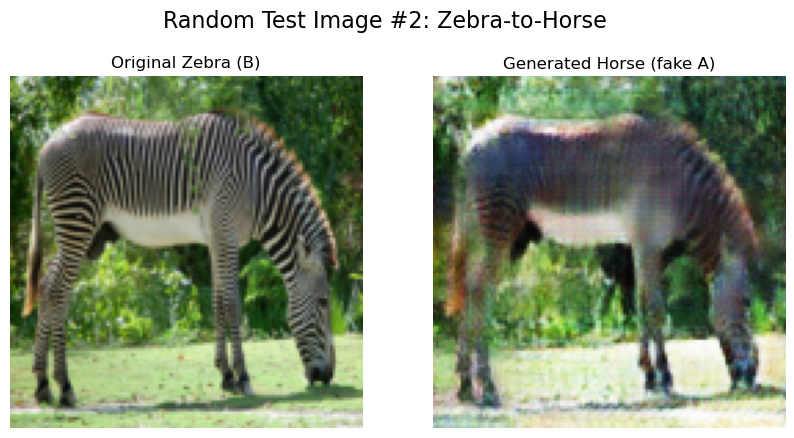

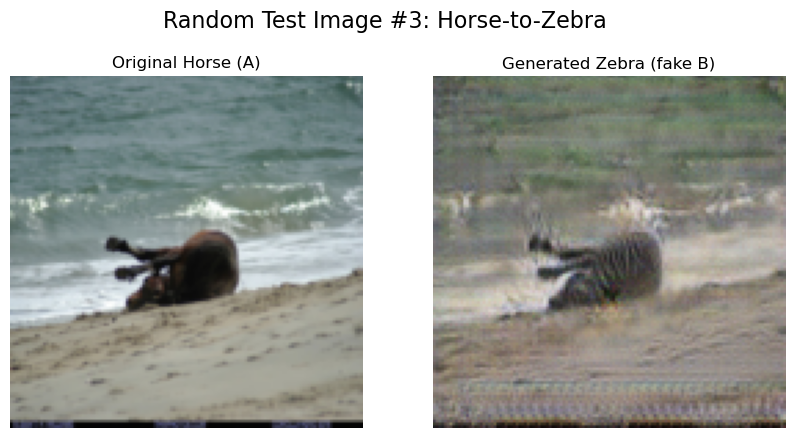

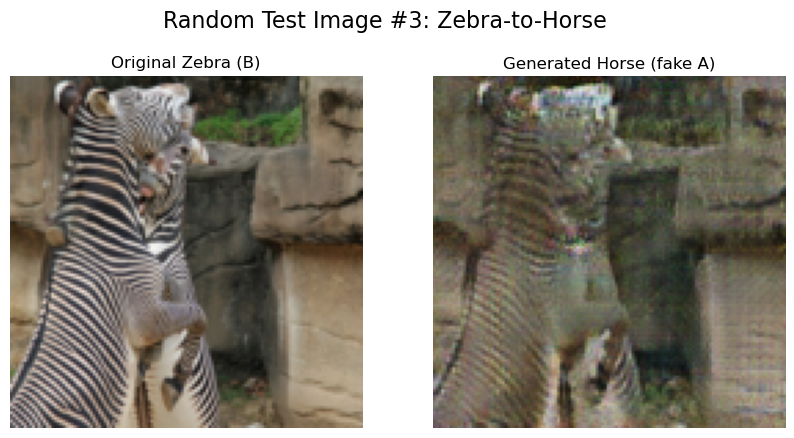

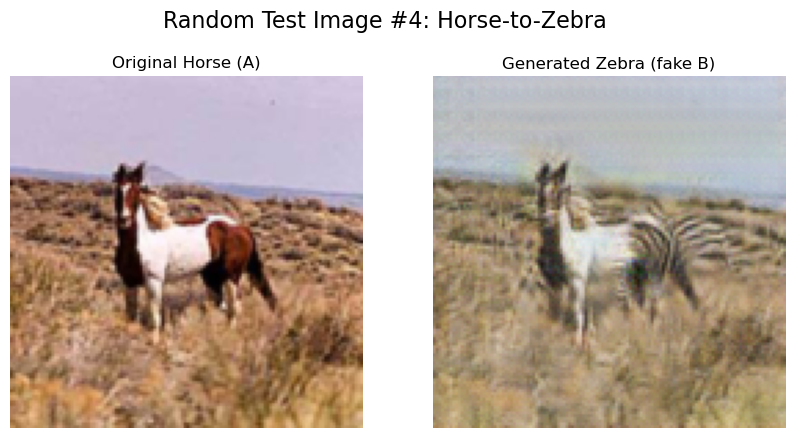

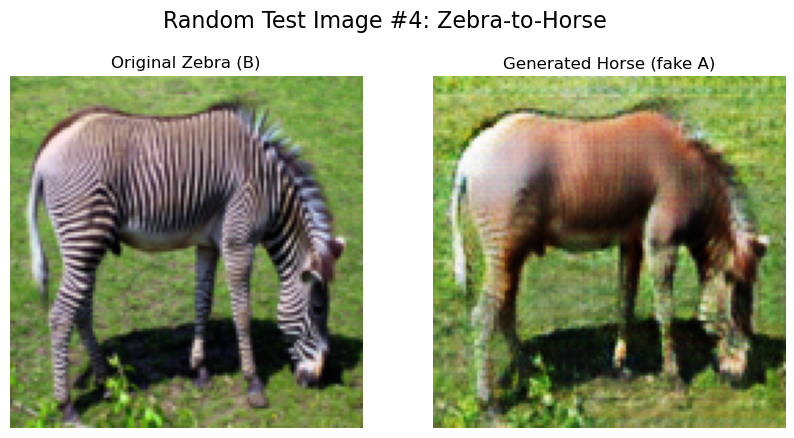

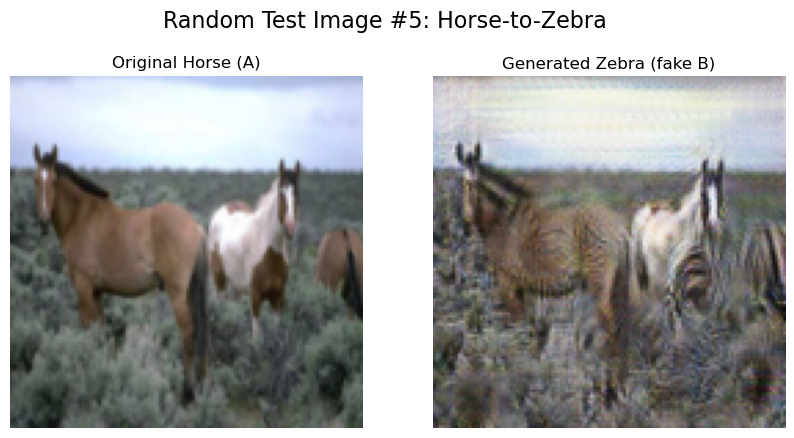

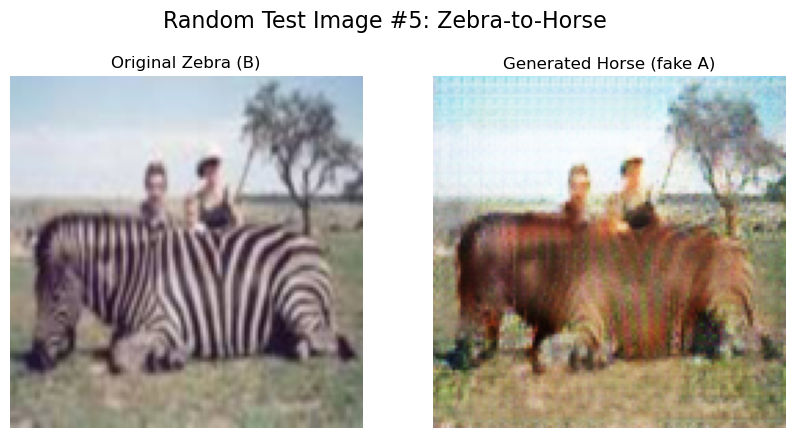

Done generating random test images. Run this cell again for 5 new images.


In [ ]:
CHECKPOINT_FILE_40 = "checkpoints/horse2zebra_40_epochs/latest_checkpoint.pth"
DATA_DIR = "horse2zebra"
IMG_SIZE = 128
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

try:
    G_AB_40 = Generator().to(device)
    G_BA_40 = Generator().to(device)
    
    checkpoint_40 = torch.load(CHECKPOINT_FILE_40, map_location=device, weights_only=False)
    G_AB_40.load_state_dict(checkpoint_40['G_AB_state_dict'])
    G_BA_40.load_state_dict(checkpoint_40['G_BA_state_dict'])
    G_AB_40.eval()
    G_BA_40.eval()
    print("Loaded 40-epoch models.")
except Exception as e:
    print(f"Error loading models: {e}. Ensure Generator class is defined.")
    raise

test_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
])
test_dataset = HorseZebraDataset(root_dir=DATA_DIR, transform=test_transform, mode='test')

test_loader = DataLoader(dataset=test_dataset, batch_size=1, shuffle=True) 

num_samples = 5

with torch.no_grad():
    for i, batch in enumerate(test_loader):
        if i >= num_samples:
            break
            
        real_A = batch['A'].to(device) # Real Horse
        real_B = batch['B'].to(device) # Real Zebra

        # Generate translations
        fake_B = G_AB_40(real_A) # Horse -> Zebra
        fake_A = G_BA_40(real_B) # Zebra -> Horse

        # Denormalize for plotting
        real_A = denormalize(real_A)
        fake_B = denormalize(fake_B)
        real_B = denormalize(real_B)
        fake_A = denormalize(fake_A)

        fig1, axes1 = plt.subplots(1, 2, figsize=(10, 5))
        fig1.suptitle(f"Random Test Image #{i+1}: Horse-to-Zebra", fontsize=16)
        axes1[0].imshow(real_A[0].cpu().permute(1, 2, 0))
        axes1[0].set_title("Original Horse (A)")
        axes1[0].axis('off')
        axes1[1].imshow(fake_B[0].cpu().permute(1, 2, 0))
        axes1[1].set_title("Generated Zebra (fake B)")
        axes1[1].axis('off')
        plt.show()

        fig2, axes2 = plt.subplots(1, 2, figsize=(10, 5))
        fig2.suptitle(f"Random Test Image #{i+1}: Zebra-to-Horse", fontsize=16)
        axes2[0].imshow(real_B[0].cpu().permute(1, 2, 0))
        axes2[0].set_title("Original Zebra (B)")
        axes2[0].axis('off')
        axes2[1].imshow(fake_A[0].cpu().permute(1, 2, 0))
        axes2[1].set_title("Generated Horse (fake A)")
        axes2[1].axis('off')
        plt.show()